# Imports

In [1]:
import pandas as pd
import numpy as np
import scipy
import math

# sklearn
# from sklearn.model_selection import train_test_split
# from sklearn.model_selection import StratifiedKFold
from sklearn.preprocessing import LabelEncoder, MinMaxScaler
from sklearn.metrics import accuracy_score
from sklearn.metrics import mean_squared_error, mean_absolute_error, r2_score

# deep learning
from tensorflow.keras import Sequential
from tensorflow.keras.layers import Dense

from matplotlib import pyplot as plt
import seaborn as sns

%matplotlib inline

In [2]:
from sklearn.cluster import KMeans
from sklearn.manifold import TSNE

In [3]:
from sklearn.tree import DecisionTreeClassifier
from sklearn import tree
from sklearn.model_selection import GridSearchCV
from sklearn.model_selection import train_test_split, cross_val_score, RandomizedSearchCV
from sklearn.metrics import accuracy_score

In [4]:
from sklearn.tree import DecisionTreeRegressor
from sklearn import tree
from sklearn.neighbors import KNeighborsRegressor
from sklearn.linear_model import LinearRegression, LogisticRegression
from sklearn.svm import SVR
from sklearn.ensemble import RandomForestRegressor

In [5]:
import tensorflow as tf
from tensorflow.keras.layers import ReLU
import tensorflow as tf
from tensorflow.keras.models import Model # basic class for specifying and training a neural network
from tensorflow.keras.layers import Input, Dense # базовый класс для задания и обучения нейронной сети

from tensorflow.keras.optimizers import SGD

In [144]:
from sklearn.preprocessing import OneHotEncoder

## Import DATA
Примечание: обосновать почему из датасета убираем первые 22 строчки из ноубука 2

In [6]:
df1 = pd.DataFrame(pd.read_excel('./data/X_bp.xlsx', index_col=0))
df2 = pd.DataFrame(pd.read_excel('./data/X_nup.xlsx', index_col=0))
df = pd.concat([df1, df2], join='inner', axis=1)
df = df[23:]
df

,Соотношение матрица-наполнитель,"Плотность, кг/м3","модуль упругости, ГПа","Количество отвердителя, м.%","Содержание эпоксидных групп,%_2","Температура вспышки, С_2","Поверхностная плотность, г/м2","Модуль упругости при растяжении, ГПа","Прочность при растяжении, МПа","Потребление смолы, г/м2","Угол нашивки, град",Шаг нашивки,Плотность нашивки
23,2.587348,1953.274926,1136.596135,137.627420,22.344534,234.716883,555.893453,80.803222,2587.342983,246.613117,90,4.000000,70.000000
24,2.499918,1942.595777,901.519947,146.252208,23.081757,351.231874,864.725484,76.178075,3705.672523,226.222760,90,5.000000,47.000000
25,2.046471,2037.631811,707.570887,101.617251,23.146393,312.307205,547.601219,73.817067,2624.026407,178.198556,90,5.000000,57.000000
26,1.856476,2018.220332,836.294382,135.401697,26.435515,327.510377,150.961449,77.210762,2473.187195,123.344561,90,5.000000,60.000000
27,3.305535,1917.907506,478.286247,105.786930,17.874100,328.154579,526.692159,72.345709,3059.032991,275.575880,90,5.000000,70.000000
...,...,...,...,...,...,...,...,...,...,...,...,...,...
1018,2.271346,1952.087902,912.855545,86.992183,20.123249,324.774576,209.198700,73.090961,2387.292495,125.007669,90,9.076380,47.019770
1019,3.444022,2050.089171,444.732634,145.981978,19.599769,254.215401,350.660830,72.920827,2360.392784,117.730099,90,10.565614,53.750790
1020,3.280604,1972.372865,416.836524,110.533477,23.957502,248.423047,740.142791,74.734344,2662.906040,236.606764,90,4.161154,67.629684
1021,3.705351,2066.799773,741.475517,141.397963,19.246945,275.779840,641.468152,74.042708,2071.715856,197.126067,90,6.313201,58.261074


In [7]:
Y = df['Соотношение матрица-наполнитель']
Y_1 = df['Модуль упругости при растяжении, ГПа']
Y_2 = df['Прочность при растяжении, МПа']
df_ = df.drop('Соотношение матрица-наполнитель', axis=1)
df_1 = df.drop(['Модуль упругости при растяжении, ГПа'], axis=1)
df_2 = df.drop(['Прочность при растяжении, МПа'], axis=1)

In [8]:
df_copy = df.copy()
df = df.drop(['Модуль упругости при растяжении, ГПа', 'Прочность при растяжении, МПа'], axis=1)

In [9]:
df_copy.corr()

,Соотношение матрица-наполнитель,"Плотность, кг/м3","модуль упругости, ГПа","Количество отвердителя, м.%","Содержание эпоксидных групп,%_2","Температура вспышки, С_2","Поверхностная плотность, г/м2","Модуль упругости при растяжении, ГПа","Прочность при растяжении, МПа","Потребление смолы, г/м2","Угол нашивки, град",Шаг нашивки,Плотность нашивки
Соотношение матрица-наполнитель,1.000000,0.011033,0.032246,-0.017575,0.027885,-0.011712,-0.011906,-0.017502,0.036288,0.078841,-0.031401,0.028404,-0.005432
"Плотность, кг/м3",0.011033,1.000000,-0.017544,-0.032137,-0.011680,-0.018260,0.038236,-0.020699,-0.074165,-0.027946,-0.065604,-0.057841,0.082868
"модуль упругости, ГПа",0.032246,-0.017544,1.000000,0.023490,-0.006186,0.031181,-0.017841,0.014482,0.048217,-0.007369,-0.020399,-0.007003,0.062844
"Количество отвердителя, м.%",-0.017575,-0.032137,0.023490,1.000000,0.013484,0.081562,0.048636,-0.076936,-0.066785,0.008184,0.040215,0.002655,0.019772
"Содержание эпоксидных групп,%_2",0.027885,-0.011680,-0.006186,0.013484,1.000000,-0.008072,-0.007685,0.064757,-0.031613,0.015057,0.008400,0.012065,-0.044336
"Температура вспышки, С_2",-0.011712,-0.018260,0.031181,0.081562,-0.008072,1.000000,0.015638,0.023145,-0.026122,0.061615,0.020632,0.018349,0.011071
"Поверхностная плотность, г/м2",-0.011906,0.038236,-0.017841,0.048636,-0.007685,0.015638,1.000000,0.014983,0.013333,0.001071,0.048971,0.041928,-0.040858
"Модуль упругости при растяжении, ГПа",-0.017502,-0.020699,0.014482,-0.076936,0.064757,0.023145,0.014983,1.000000,0.011490,0.045590,0.020558,-0.031345,0.014858
"Прочность при растяжении, МПа",0.036288,-0.074165,0.048217,-0.066785,-0.031613,-0.026122,0.013333,0.011490,1.000000,0.026477,0.025412,-0.056045,0.014987
"Потребление смолы, г/м2",0.078841,-0.027946,-0.007369,0.008184,0.015057,0.061615,0.001071,0.045590,0.026477,1.000000,-0.017891,0.021919,0.020064


In [10]:
df.corr()

,Соотношение матрица-наполнитель,"Плотность, кг/м3","модуль упругости, ГПа","Количество отвердителя, м.%","Содержание эпоксидных групп,%_2","Температура вспышки, С_2","Поверхностная плотность, г/м2","Потребление смолы, г/м2","Угол нашивки, град",Шаг нашивки,Плотность нашивки
Соотношение матрица-наполнитель,1.000000,0.011033,0.032246,-0.017575,0.027885,-0.011712,-0.011906,0.078841,-0.031401,0.028404,-0.005432
"Плотность, кг/м3",0.011033,1.000000,-0.017544,-0.032137,-0.011680,-0.018260,0.038236,-0.027946,-0.065604,-0.057841,0.082868
"модуль упругости, ГПа",0.032246,-0.017544,1.000000,0.023490,-0.006186,0.031181,-0.017841,-0.007369,-0.020399,-0.007003,0.062844
"Количество отвердителя, м.%",-0.017575,-0.032137,0.023490,1.000000,0.013484,0.081562,0.048636,0.008184,0.040215,0.002655,0.019772
"Содержание эпоксидных групп,%_2",0.027885,-0.011680,-0.006186,0.013484,1.000000,-0.008072,-0.007685,0.015057,0.008400,0.012065,-0.044336
"Температура вспышки, С_2",-0.011712,-0.018260,0.031181,0.081562,-0.008072,1.000000,0.015638,0.061615,0.020632,0.018349,0.011071
"Поверхностная плотность, г/м2",-0.011906,0.038236,-0.017841,0.048636,-0.007685,0.015638,1.000000,0.001071,0.048971,0.041928,-0.040858
"Потребление смолы, г/м2",0.078841,-0.027946,-0.007369,0.008184,0.015057,0.061615,0.001071,1.000000,-0.017891,0.021919,0.020064
"Угол нашивки, град",-0.031401,-0.065604,-0.020399,0.040215,0.008400,0.020632,0.048971,-0.017891,1.000000,0.026812,0.109809
Шаг нашивки,0.028404,-0.057841,-0.007003,0.002655,0.012065,0.018349,0.041928,0.021919,0.026812,1.000000,-0.008793


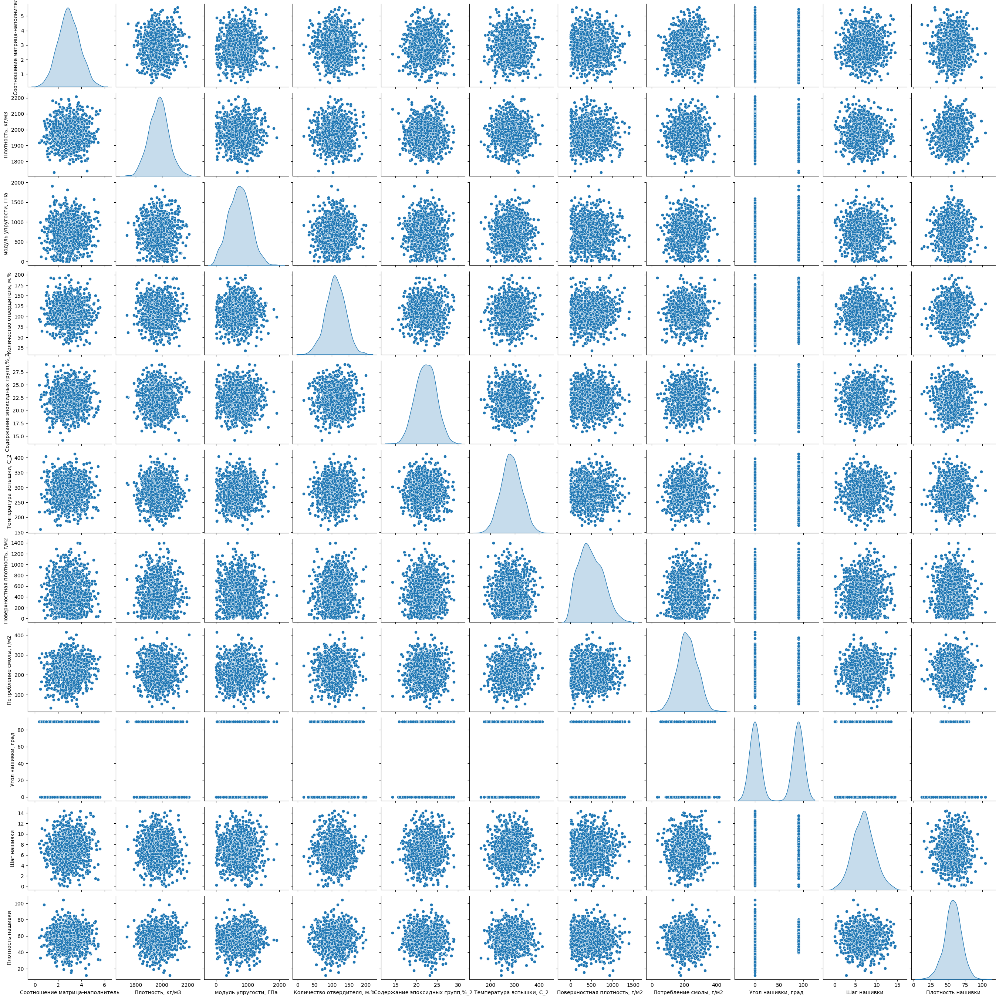

In [11]:
sns.pairplot(df, diag_kind='kde')

# Разобьем данные на кластеры

## Подбор оптимального количества кластеров

### Метод локтя для подбора оптимального количества кластеров

In [12]:
distortions = []
for i in range(1, 30):
    kmeans = KMeans(
        n_clusters=i, # На сколько кластеров поделить наш ДС
        init='random', # Начальная инициализация центров кластеров
        n_init=10, # Начальное колиечтво этих точек (центров класстеров)
        max_iter=300, # 
        tol=1e-04 # Величина изменения при сдвиге
    )
    kmeans_prediction = kmeans.fit_predict(df)Ы
    distortions.append(kmeans.inertia_)

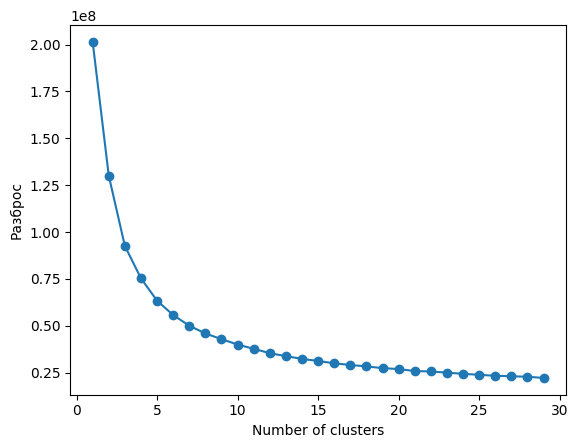

In [13]:
plt.plot(range(1,30), distortions, marker='o')
plt.xlabel('Number of clusters')
plt.ylabel('Разброс')
plt.show()

Оптимальным, с виду, колличеством класстеров является 15

### Для визуализации адекватности разбития данных будем использовать TSNE

In [14]:
tsne_clusters_number = TSNE(n_components=2, init='random').fit_transform(df)
tsne_clusters_number

array([[  0.5015393, -27.567501 ],
       [-22.416855 , -14.2806425],
       [ -4.3096795,   0.6719188],
       ...,
       [-22.449406 ,  14.240653 ],
       [-12.646672 ,  -3.2739203],
       [-22.67258  ,  12.558427 ]], dtype=float32)

### На основании вышеполученной информации, попроубем разбить данные на 8 класстеров

In [15]:
kmeans = KMeans(
    n_clusters=8, # На сколько кластеров поделить наш ДС
    init='random', # Начальная инициализация центров кластеров
    n_init=10, # Начальное колиечтво этих точек (центров класстеров)
    max_iter=300, # 
    tol=1e-04 # Величина изменения при сдвиге
)
kmeans_prediction = kmeans.fit_predict(df)

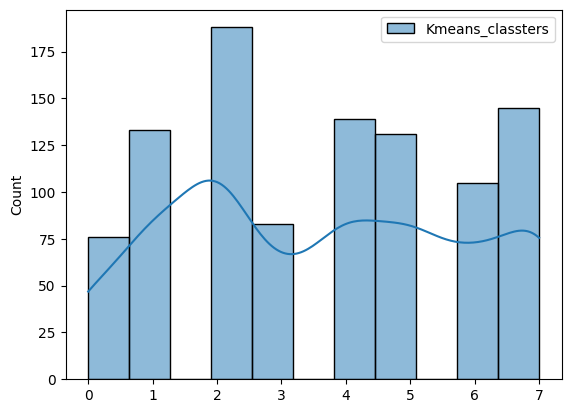

In [16]:
# Смотрим распределение данных по кластерам
sns.histplot(data = {"Kmeans_classters": kmeans_prediction}, 
             kde=True)
plt.show()

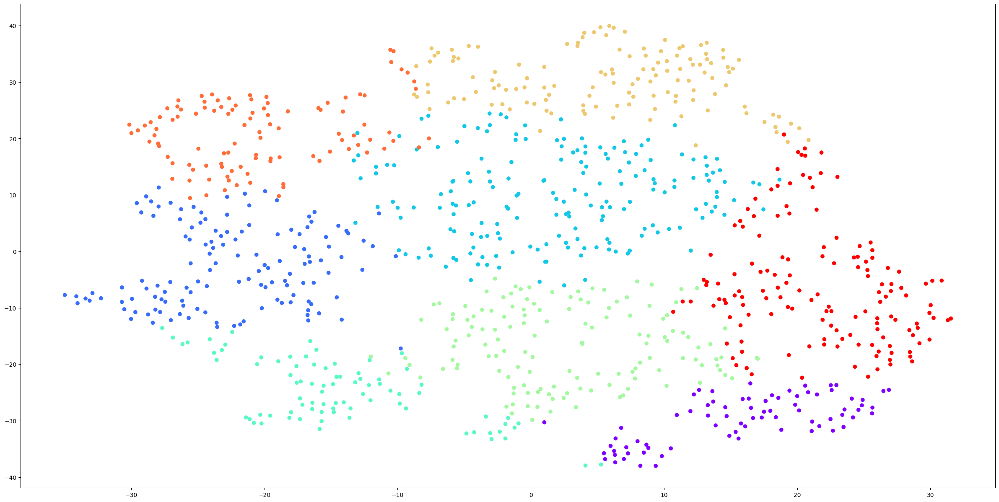

In [17]:
fig = plt.figure(figsize=(30, 15))
ax = fig.add_subplot()
ax.scatter(tsne_clusters_number[:, 0], tsne_clusters_number[:, 1], c=kmeans.labels_, marker='o', cmap='rainbow')
# ax.set_title("%s: (%.2g sec)" % (label, t1 - t0))
ax.axis('tight')
plt.show()

### На основании вышеполученной информации, попроубем разбить данные на 9 класстеров

In [18]:
kmeans = KMeans(
    n_clusters=9, # На сколько кластеров поделить наш ДС
    init='random', # Начальная инициализация центров кластеров
    n_init=10, # Начальное колиечтво этих точек (центров класстеров)
    max_iter=300, # 
    tol=1e-04 # Величина изменения при сдвиге
)
kmeans_prediction = kmeans.fit_predict(df)

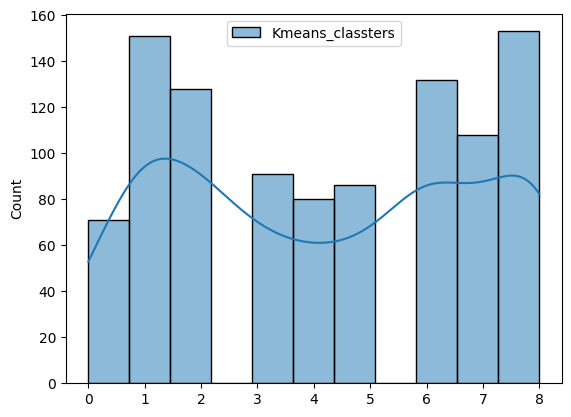

In [19]:
# Смотрим распределение данных по кластерам
sns.histplot(data = {"Kmeans_classters": kmeans_prediction}, 
             kde=True)
plt.show()

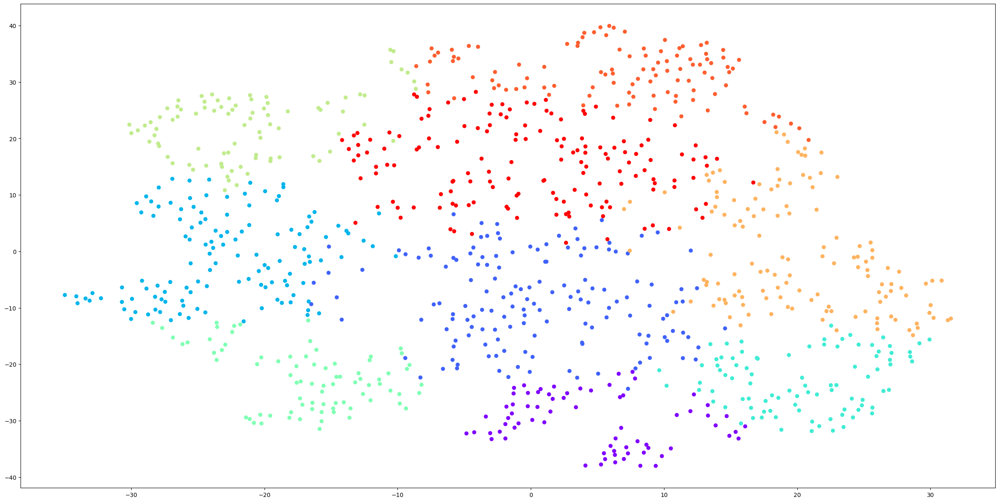

In [20]:
fig = plt.figure(figsize=(30, 15))
ax = fig.add_subplot()
ax.scatter(tsne_clusters_number[:, 0], tsne_clusters_number[:, 1], c=kmeans.labels_, marker='o', cmap='rainbow')
# ax.set_title("%s: (%.2g sec)" % (label, t1 - t0))
ax.axis('tight')
plt.show()

Как мы видим один из кластеров пустой, имеет смысл разбить на 8

### На основании вышеполученной информации, попроубем разбить данные на 10 класстеров

In [21]:
kmeans = KMeans(
    n_clusters=15, # На сколько кластеров поделить наш ДС
    init='random', # Начальная инициализация центров кластеров
    n_init=10, # Начальное колиечтво этих точек (центров класстеров)
    max_iter=300, # 
    tol=1e-04 # Величина изменения при сдвиге
)
kmeans_prediction = kmeans.fit_predict(df)

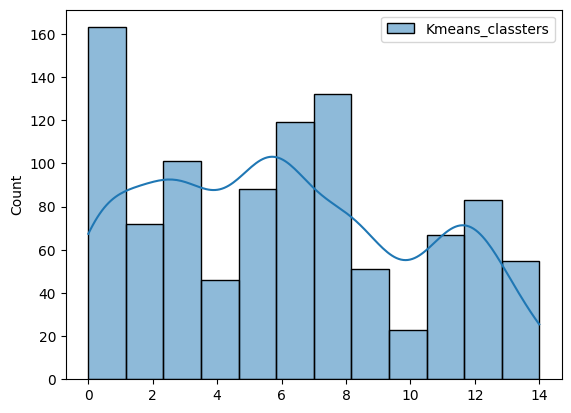

In [22]:
# Смотрим распределение данных по кластерам
sns.histplot(data = {"Kmeans_classters": kmeans_prediction}, 
             kde=True)
plt.show()

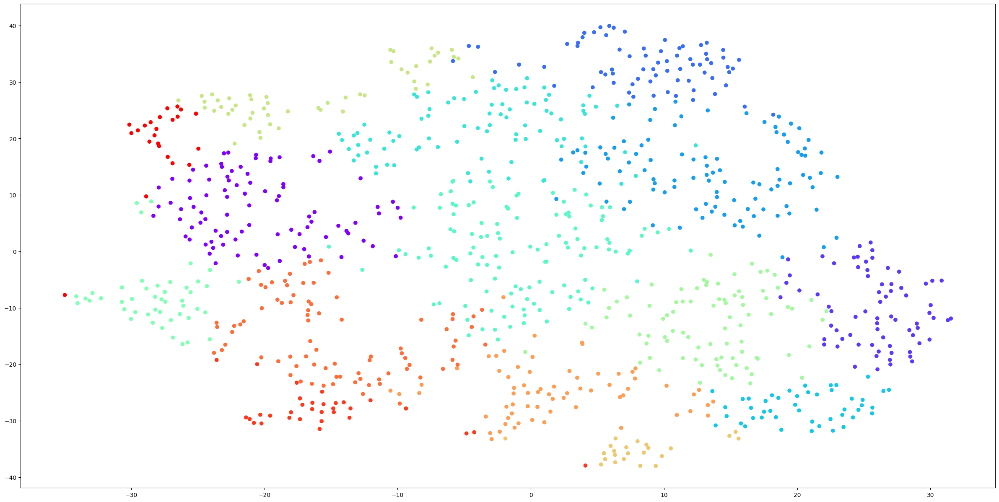

In [23]:
fig = plt.figure(figsize=(30, 15))
ax = fig.add_subplot()
ax.scatter(tsne_clusters_number[:, 0], tsne_clusters_number[:, 1], c=kmeans.labels_, marker='o', cmap='rainbow')
# ax.set_title("%s: (%.2g sec)" % (label, t1 - t0))
ax.axis('tight')
plt.show()

### На основании вышеполученной информации, попроубем разбить данные на 11 класстеров

In [24]:
kmeans = KMeans(
    n_clusters=11, # На сколько кластеров поделить наш ДС
    init='random', # Начальная инициализация центров кластеров
    n_init=10, # Начальное колиечтво этих точек (центров класстеров)
    max_iter=300, # 
    tol=1e-04 # Величина изменения при сдвиге
)
kmeans_prediction = kmeans.fit_predict(df)

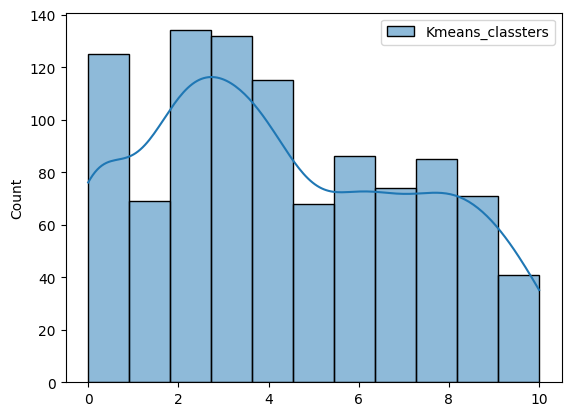

In [25]:
# Смотрим распределение данных по кластерам
sns.histplot(data = {"Kmeans_classters": kmeans_prediction}, 
             kde=True)
plt.show()

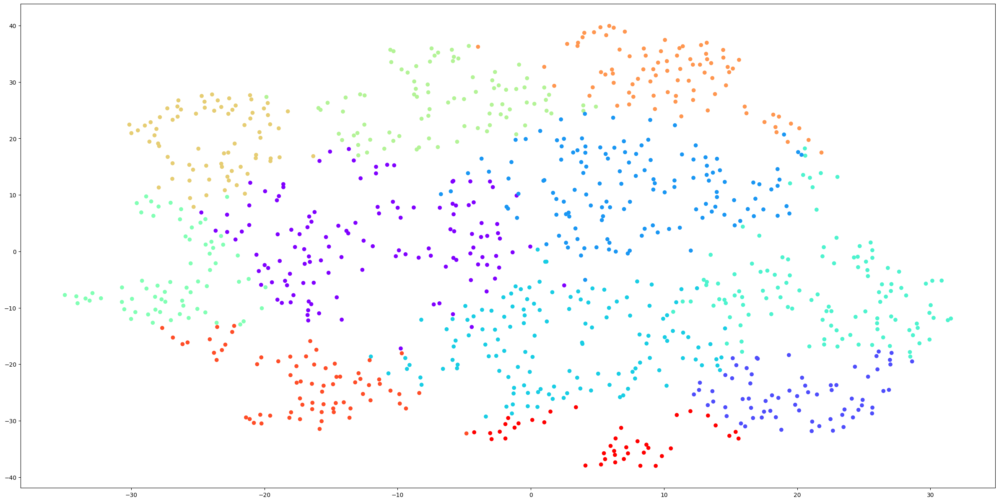

In [26]:
fig = plt.figure(figsize=(30, 15))
ax = fig.add_subplot()
ax.scatter(tsne_clusters_number[:, 0], tsne_clusters_number[:, 1], c=kmeans.labels_, marker='o', cmap='rainbow')
# ax.set_title("%s: (%.2g sec)" % (label, t1 - t0))
ax.axis('tight')
plt.show()

### На основании вышеполученной информации, попроубем разбить данные на 12 класстеров

In [27]:
kmeans = KMeans(
    n_clusters=15, # На сколько кластеров поделить наш ДС
    init='random', # Начальная инициализация центров кластеров
    n_init=10, # Начальное колиечтво этих точек (центров класстеров)
    max_iter=300, # 
    tol=1e-04 # Величина изменения при сдвиге
)
kmeans_prediction = kmeans.fit_predict(df)

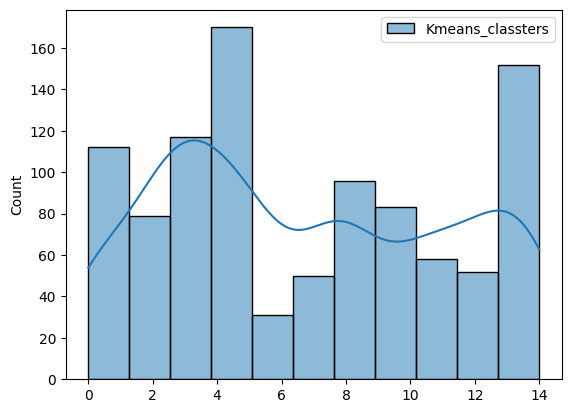

In [28]:
# Смотрим распределение данных по кластерам
sns.histplot(data = {"Kmeans_classters": kmeans_prediction}, 
             kde=True)
plt.show()

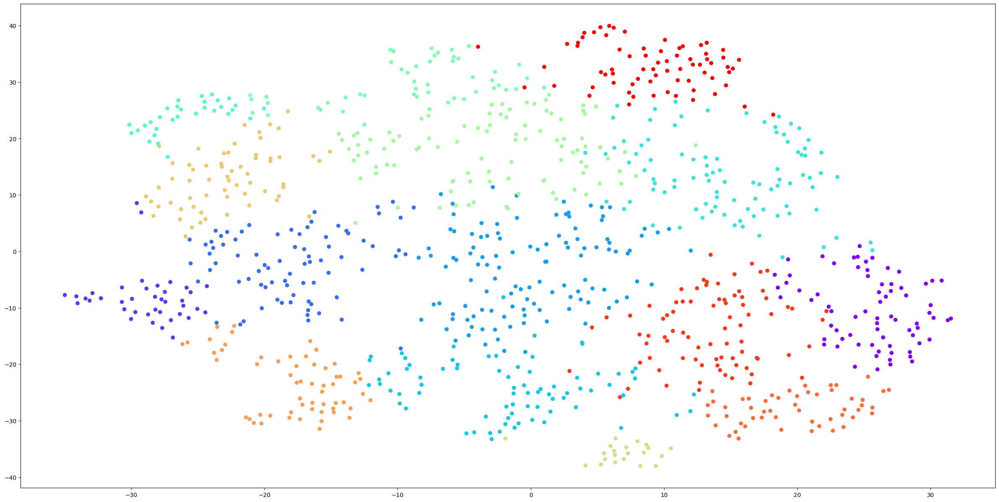

In [29]:
fig = plt.figure(figsize=(30, 15))
ax = fig.add_subplot()
ax.scatter(tsne_clusters_number[:, 0], tsne_clusters_number[:, 1], c=kmeans.labels_, marker='o', cmap='rainbow')
# ax.set_title("%s: (%.2g sec)" % (label, t1 - t0))
ax.axis('tight')
plt.show()

### На основании вышеполученной информации, попроубем разбить данные на 13 класстеров

In [30]:
kmeans = KMeans(
    n_clusters=13, # На сколько кластеров поделить наш ДС
    init='random', # Начальная инициализация центров кластеров
    n_init=10, # Начальное колиечтво этих точек (центров класстеров)
    max_iter=300, # 
    tol=1e-04 # Величина изменения при сдвиге
)
kmeans_prediction = kmeans.fit_predict(df)

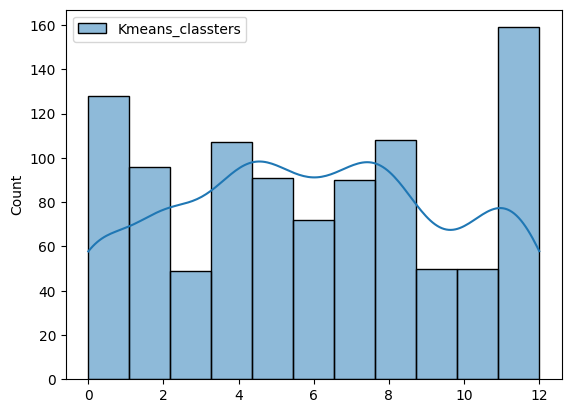

In [31]:
# Смотрим распределение данных по кластерам
sns.histplot(data = {"Kmeans_classters": kmeans_prediction}, 
             kde=True)
plt.show()

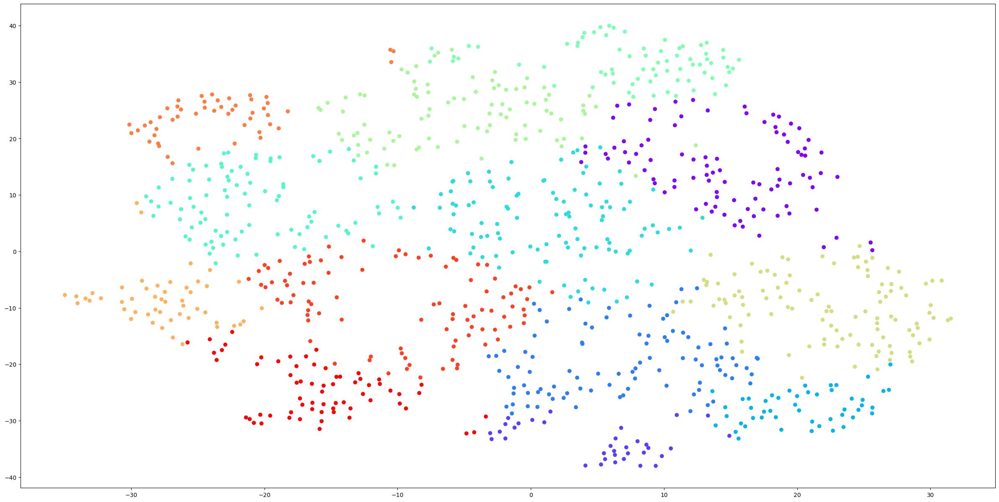

In [32]:
fig = plt.figure(figsize=(30, 15))
ax = fig.add_subplot()
ax.scatter(tsne_clusters_number[:, 0], tsne_clusters_number[:, 1], c=kmeans.labels_, marker='o', cmap='rainbow')
# ax.set_title("%s: (%.2g sec)" % (label, t1 - t0))
ax.axis('tight')
plt.show()

### На основании вышеполученной информации, попроубем разбить данные на 14 класстеров

In [33]:
kmeans = KMeans(
    n_clusters=14, # На сколько кластеров поделить наш ДС
    init='random', # Начальная инициализация центров кластеров
    n_init=10, # Начальное колиечтво этих точек (центров класстеров)
    max_iter=300, # 
    tol=1e-04 # Величина изменения при сдвиге
)
kmeans_prediction = kmeans.fit_predict(df)

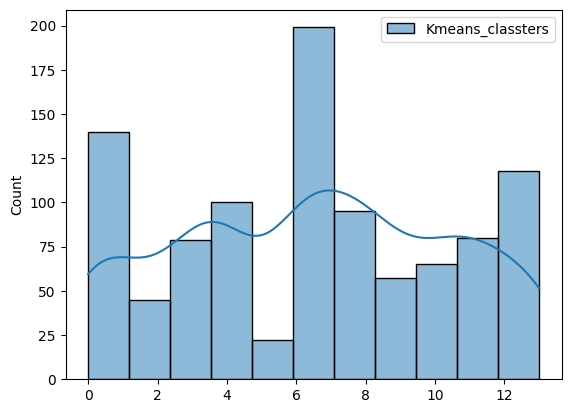

In [34]:
# Смотрим распределение данных по кластерам
sns.histplot(data = {"Kmeans_classters": kmeans_prediction}, 
             kde=True)
plt.show()

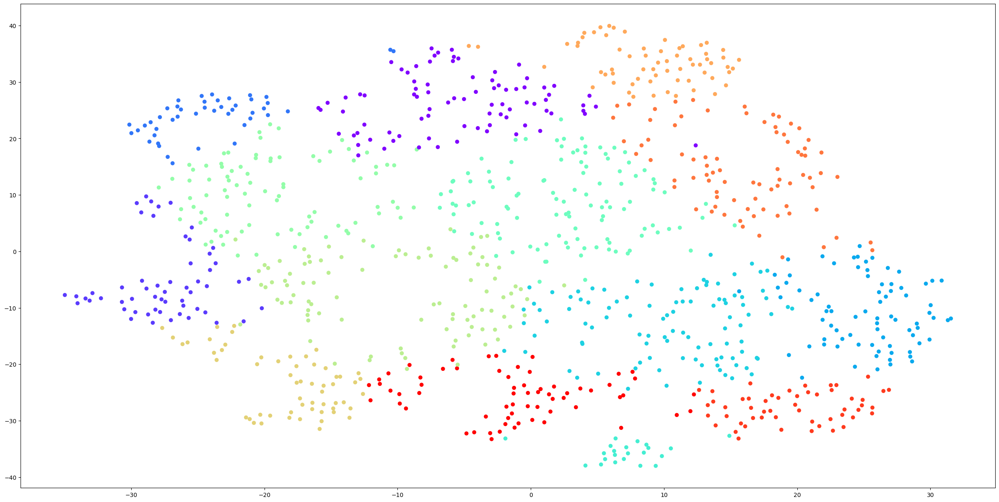

In [35]:
fig = plt.figure(figsize=(30, 15))
ax = fig.add_subplot()
ax.scatter(tsne_clusters_number[:, 0], tsne_clusters_number[:, 1], c=kmeans.labels_, marker='o', cmap='rainbow')
# ax.set_title("%s: (%.2g sec)" % (label, t1 - t0))
ax.axis('tight')
plt.show()

### На основании вышеполученной информации, попроубем разбить данные на 15 класстеров

In [36]:
kmeans = KMeans(
    n_clusters=15, # На сколько кластеров поделить наш ДС
    init='random', # Начальная инициализация центров кластеров
    n_init=10, # Начальное колиечтво этих точек (центров класстеров)
    max_iter=300, # 
    tol=1e-04 # Величина изменения при сдвиге
)
kmeans_prediction = kmeans.fit_predict(df)
kmeans_prediction

array([ 5,  9,  3,  4, 10,  8, 11,  6,  0,  1, 14,  6,  3, 10,  2,  6,  2,
        8, 13,  1,  9, 11,  4,  5, 14,  4,  5, 10,  1, 10,  6, 10, 10,  3,
        1,  0, 13, 11,  3, 13,  3,  8,  1,  8, 10, 13, 10,  6,  7,  9,  3,
       13,  3,  5,  7, 10,  1, 10, 14,  5,  5,  7,  6, 13, 13,  7,  9,  0,
        8,  3, 10,  1, 14, 11,  6,  6,  1,  3,  7,  3,  6,  1,  6,  5,  5,
        4, 13, 14,  4, 10,  9,  9,  0,  6, 10,  4,  6,  1,  7,  7,  1,  1,
        4,  9,  8, 13,  4,  8, 12, 11,  2, 10, 14,  1,  8,  6, 14,  0,  3,
        6,  3, 11,  6,  8,  0,  4,  3,  9,  0, 13,  0,  4,  9,  9,  0,  8,
        6, 13, 12,  9,  8, 11,  6, 14, 11,  5, 13,  5, 12,  0, 10,  3,  6,
        1,  4,  8,  8,  1,  6,  2,  6,  5,  9, 12,  8,  0,  6,  6,  6,  5,
       11, 11, 14, 13,  1, 10, 12,  6,  4,  5,  6, 13,  4,  5,  1,  6, 11,
        3, 11,  0, 13,  1,  2,  9,  6,  6,  6, 12,  9,  0,  9, 11,  3,  1,
        0, 10,  8,  8,  8,  2,  8, 11,  9, 14, 13,  5,  3, 13,  6, 12,  0,
       11, 10,  3,  9, 11

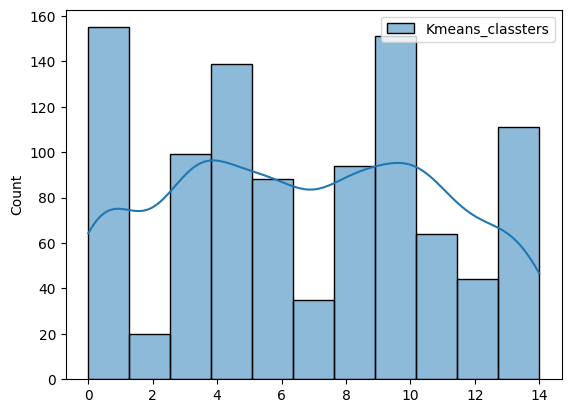

In [37]:
# Смотрим распределение данных по кластерам
sns.histplot(data = {"Kmeans_classters": kmeans_prediction}, 
             kde=True)
plt.show()

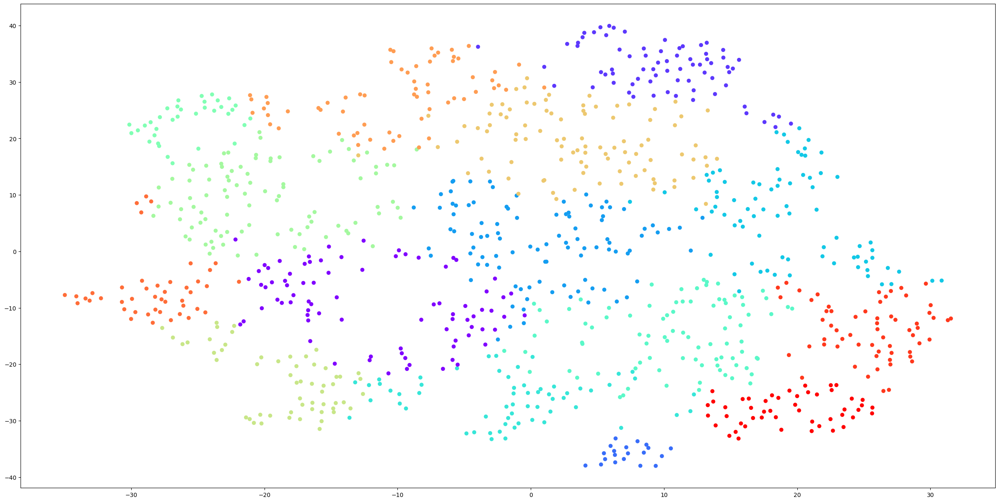

In [38]:
fig = plt.figure(figsize=(30, 15))
ax = fig.add_subplot()
ax.scatter(tsne_clusters_number[:, 0], tsne_clusters_number[:, 1], c=kmeans.labels_, marker='o', cmap='rainbow')
# ax.set_title("%s: (%.2g sec)" % (label, t1 - t0))
ax.axis('tight')
plt.show()

Как мы видим многие точки находятся довольно далеко от своих кластеров, попробуем другое разбиение

### Вывод
Если полагаться на визуальный анализ, то 9 класстеров является наилучшим результатом
Выбросы из класетров имеются, но их единицы

## На основании вышеполученной информации, разобьем данные на 9 класстеров

In [39]:
kmeans = KMeans(
    n_clusters=9, # На сколько кластеров поделить наш ДС
    init='random', # Начальная инициализация центров кластеров
    n_init=5, # Начальное колиечтво этих точек (центров класстеров)
    max_iter=500, # 
    tol=1e-04 # Величина изменения при сдвиге
)
kmeans_prediction = kmeans.fit_predict(df)

In [40]:
df['Claster'] = kmeans_prediction

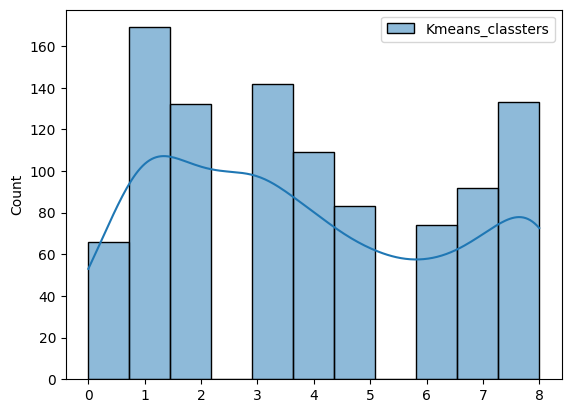

In [41]:
# Смотрим распределение данных по кластерам
sns.histplot(data = {"Kmeans_classters": kmeans_prediction}, 
             kde=True)
plt.show()

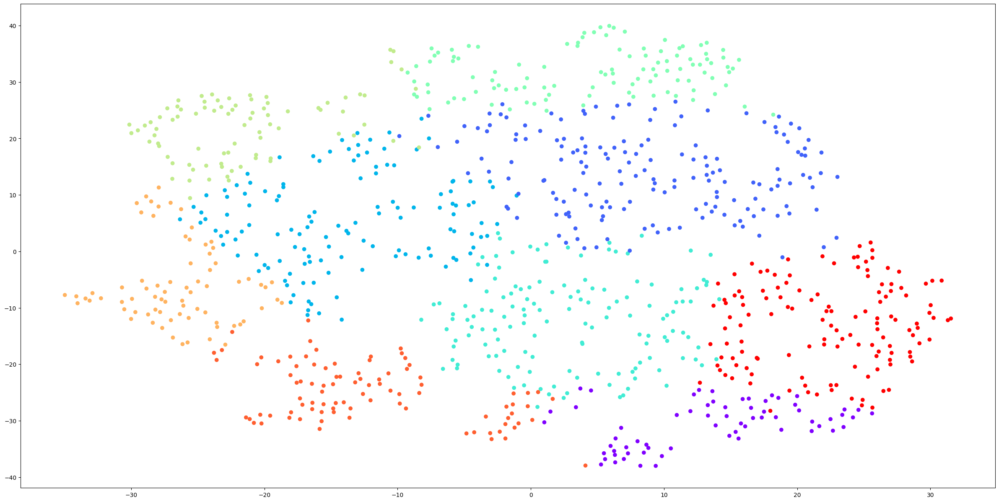

In [42]:
fig = plt.figure(figsize=(30, 15))
ax = fig.add_subplot()
ax.scatter(tsne_clusters_number[:, 0], tsne_clusters_number[:, 1], c=kmeans.labels_, marker='o', cmap='rainbow')
# ax.set_title("%s: (%.2g sec)" % (label, t1 - t0))
ax.axis('tight')
plt.show()

# Обучим классификатор "дерево решений" и посмотрим по каким параметрам определяется класс

In [43]:
df.shape

(1000, 12)

In [44]:
x = df.drop('Claster', axis=1)
y = kmeans.labels_

In [45]:
# Get train and test sets
x_train, x_test, y_train, y_test = train_test_split(x, y, train_size=0.9)

In [46]:
# Classifier
np.random.seed(42)

param_grid = {# 'max_features': ['sqrt', 'log2'], # Макс кол-во признаков в листе
             'ccp_alpha': [0.1, .01, .001], # Внутренняя подстройка параметров
             'max_depth': [3, 10], # Макс глубина дерева
             # 'criterion': ['gini', 'entropy', 'log_loss'] # Функция для измерения качества разделения.
              'criterion': ['gini'] # Оптимален
             }
dec_tree = DecisionTreeClassifier()
grid_search = GridSearchCV(estimator=dec_tree, param_grid=param_grid, cv=3, verbose=True)
grid_search.fit(x_train, y_train)
best_dec_tree = grid_search.best_estimator_

Fitting 3 folds for each of 6 candidates, totalling 18 fits


In [47]:
score = accuracy_score(y_test, best_dec_tree.predict(x_test))
print("accuracy:", score)

accuracy: 0.9


In [48]:
plt.figure(figsize=(300,50))
tree.plot_tree(best_dec_tree, feature_names=df.columns[:], fontsize=20)
plt.savefig('Dtree.png')

In [49]:
df.columns

Index(['Соотношение матрица-наполнитель', 'Плотность, кг/м3',
       'модуль упругости, ГПа', 'Количество отвердителя, м.%',
       'Содержание эпоксидных групп,%_2', 'Температура вспышки, С_2',
       'Поверхностная плотность, г/м2', 'Потребление смолы, г/м2',
       'Угол нашивки, град', 'Шаг нашивки', 'Плотность нашивки', 'Claster'],
      dtype='object')

## Значимость параетров:

Больше всего модель опирается на:

1) 'модуль упругости, ГПа
2) 'Поверхностная плотность, г/м2'
3) 'Температура вспышки, С_2'
4) 'Соотношение матрица-наполнитель'

Меньше всего модель опирается на:

1) 'Содержание эпоксидных групп,%_2'
2) 'Потребление смолы, г/м2'
3) 'Плотность, кг/м3'
6) 'Количество отвердителя, м.%'
7) 'Плотность нашивки'

Модель вообще не опирается на:

1) 'Шаг нашивки'
2) 'Угол нашивки, град'

! Возможно данные параметры можно удалить из датасета

1) 'Шаг нашивки'
2) 'Угол нашивки, град'

In [50]:
df.corr()

,Соотношение матрица-наполнитель,"Плотность, кг/м3","модуль упругости, ГПа","Количество отвердителя, м.%","Содержание эпоксидных групп,%_2","Температура вспышки, С_2","Поверхностная плотность, г/м2","Потребление смолы, г/м2","Угол нашивки, град",Шаг нашивки,Плотность нашивки,Claster
Соотношение матрица-наполнитель,1.000000,0.011033,0.032246,-0.017575,0.027885,-0.011712,-0.011906,0.078841,-0.031401,0.028404,-0.005432,-0.014617
"Плотность, кг/м3",0.011033,1.000000,-0.017544,-0.032137,-0.011680,-0.018260,0.038236,-0.027946,-0.065604,-0.057841,0.082868,0.023465
"модуль упругости, ГПа",0.032246,-0.017544,1.000000,0.023490,-0.006186,0.031181,-0.017841,-0.007369,-0.020399,-0.007003,0.062844,0.102679
"Количество отвердителя, м.%",-0.017575,-0.032137,0.023490,1.000000,0.013484,0.081562,0.048636,0.008184,0.040215,0.002655,0.019772,0.043417
"Содержание эпоксидных групп,%_2",0.027885,-0.011680,-0.006186,0.013484,1.000000,-0.008072,-0.007685,0.015057,0.008400,0.012065,-0.044336,-0.057120
"Температура вспышки, С_2",-0.011712,-0.018260,0.031181,0.081562,-0.008072,1.000000,0.015638,0.061615,0.020632,0.018349,0.011071,0.026491
"Поверхностная плотность, г/м2",-0.011906,0.038236,-0.017841,0.048636,-0.007685,0.015638,1.000000,0.001071,0.048971,0.041928,-0.040858,0.123510
"Потребление смолы, г/м2",0.078841,-0.027946,-0.007369,0.008184,0.015057,0.061615,0.001071,1.000000,-0.017891,0.021919,0.020064,0.017210
"Угол нашивки, град",-0.031401,-0.065604,-0.020399,0.040215,0.008400,0.020632,0.048971,-0.017891,1.000000,0.026812,0.109809,-0.067140
Шаг нашивки,0.028404,-0.057841,-0.007003,0.002655,0.012065,0.018349,0.041928,0.021919,0.026812,1.000000,-0.008793,-0.011475


# Проанализируем корреляцию данных параметров в каждом отдельном кластере

In [51]:
ds_by_clusters = []
for n in range(0, max(np.unique(kmeans_prediction)) + 1):
    one_clusster = df.loc[(df['Claster'] == n), ]
    ds_by_clusters.append(one_clusster)

## Проанализаирум каждый кластер

### Анализ кластера 1

In [52]:
ds_by_clusters[0].shape

(66, 12)

In [53]:
ds_clasters_cor_0 = ds_by_clusters[0].corr()
ds_clasters_cor_0

,Соотношение матрица-наполнитель,"Плотность, кг/м3","модуль упругости, ГПа","Количество отвердителя, м.%","Содержание эпоксидных групп,%_2","Температура вспышки, С_2","Поверхностная плотность, г/м2","Потребление смолы, г/м2","Угол нашивки, град",Шаг нашивки,Плотность нашивки,Claster
Соотношение матрица-наполнитель,1.000000,0.177525,-0.271604,-0.039776,0.096974,0.136850,0.054028,0.089297,0.105049,0.077083,0.065958,NaN
"Плотность, кг/м3",0.177525,1.000000,0.078117,-0.054189,-0.167816,-0.179055,0.201395,0.099918,0.107260,-0.087311,0.305923,NaN
"модуль упругости, ГПа",-0.271604,0.078117,1.000000,0.019231,-0.229233,-0.018166,0.202561,-0.019883,0.190489,-0.045091,0.072964,NaN
"Количество отвердителя, м.%",-0.039776,-0.054189,0.019231,1.000000,0.114652,0.027329,0.071375,-0.138183,0.219327,0.049611,-0.010790,NaN
"Содержание эпоксидных групп,%_2",0.096974,-0.167816,-0.229233,0.114652,1.000000,0.149366,0.011789,0.096907,-0.059175,0.104900,0.055053,NaN
"Температура вспышки, С_2",0.136850,-0.179055,-0.018166,0.027329,0.149366,1.000000,-0.160252,-0.008190,-0.147466,-0.114541,-0.031619,NaN
"Поверхностная плотность, г/м2",0.054028,0.201395,0.202561,0.071375,0.011789,-0.160252,1.000000,0.005677,0.063793,0.026284,-0.057733,NaN
"Потребление смолы, г/м2",0.089297,0.099918,-0.019883,-0.138183,0.096907,-0.008190,0.005677,1.000000,-0.018834,0.258471,0.211252,NaN
"Угол нашивки, град",0.105049,0.107260,0.190489,0.219327,-0.059175,-0.147466,0.063793,-0.018834,1.000000,-0.007275,0.160879,NaN
Шаг нашивки,0.077083,-0.087311,-0.045091,0.049611,0.104900,-0.114541,0.026284,0.258471,-0.007275,1.000000,0.000827,NaN


<Axes: >

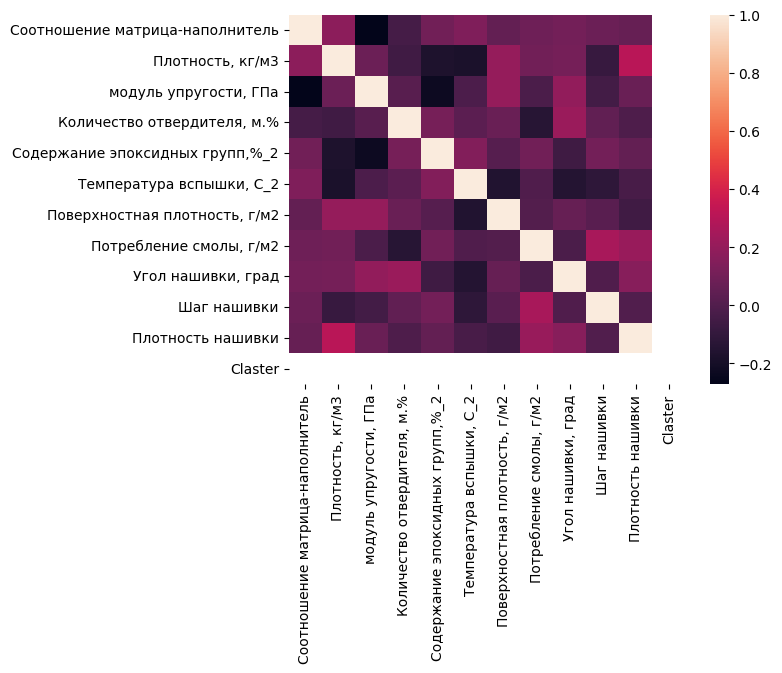

In [54]:
sns.heatmap(ds_clasters_cor_0)

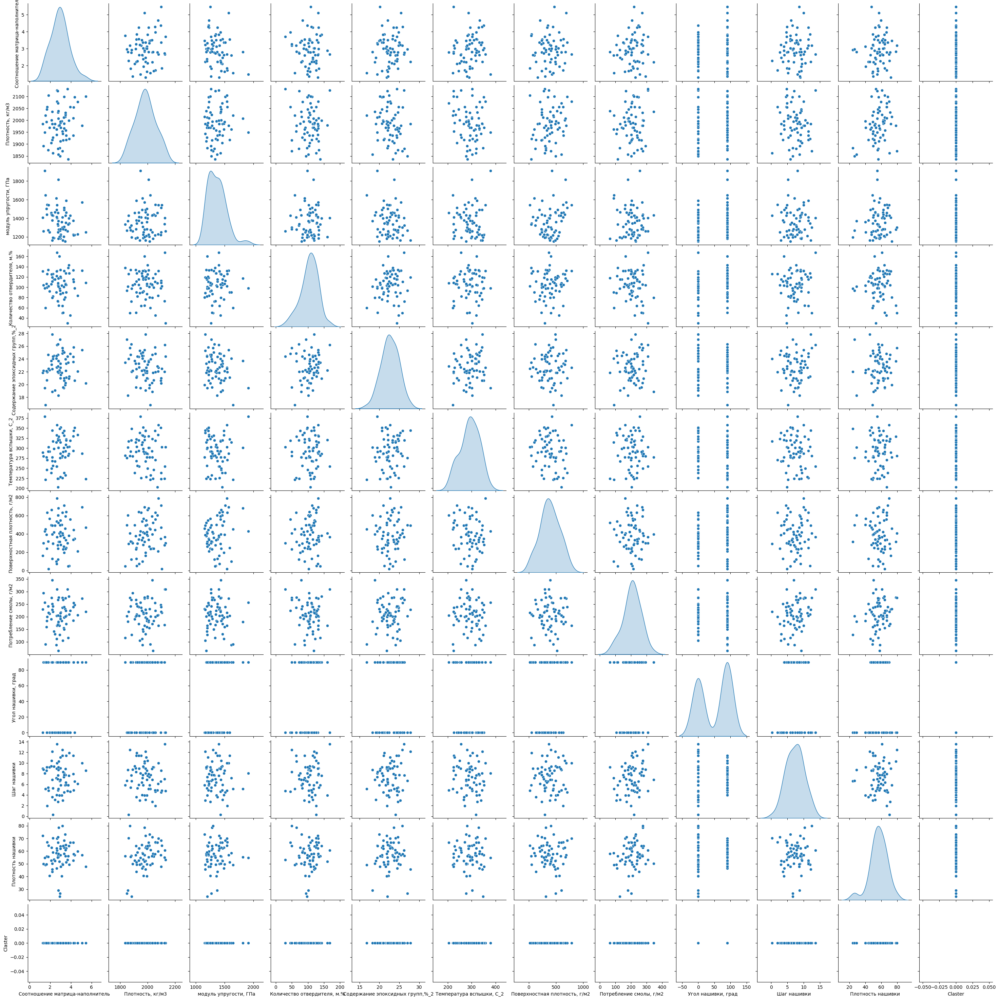

In [55]:
sns.pairplot(ds_by_clusters[0], diag_kind='kde')

### Анализ кластера 2

In [56]:
ds_by_clusters[1].shape

(169, 12)

In [57]:
ds_clasters_cor_1 = ds_by_clusters[2].corr()
ds_clasters_cor_1

,Соотношение матрица-наполнитель,"Плотность, кг/м3","модуль упругости, ГПа","Количество отвердителя, м.%","Содержание эпоксидных групп,%_2","Температура вспышки, С_2","Поверхностная плотность, г/м2","Потребление смолы, г/м2","Угол нашивки, град",Шаг нашивки,Плотность нашивки,Claster
Соотношение матрица-наполнитель,1.000000,0.014485,-0.073354,0.030185,0.056436,-0.175454,-0.228575,0.128688,0.023483,0.041593,0.063466,NaN
"Плотность, кг/м3",0.014485,1.000000,-0.010894,-0.080836,-0.090377,-0.013658,-0.016661,-0.046957,-0.215063,-0.084685,-0.022825,NaN
"модуль упругости, ГПа",-0.073354,-0.010894,1.000000,0.065435,0.125971,0.020286,0.112775,-0.044552,-0.034270,0.030672,-0.108470,NaN
"Количество отвердителя, м.%",0.030185,-0.080836,0.065435,1.000000,0.086277,0.118622,-0.006063,-0.046232,0.078439,-0.024890,-0.023694,NaN
"Содержание эпоксидных групп,%_2",0.056436,-0.090377,0.125971,0.086277,1.000000,-0.051583,0.097289,0.028954,-0.024098,0.062975,0.027851,NaN
"Температура вспышки, С_2",-0.175454,-0.013658,0.020286,0.118622,-0.051583,1.000000,-0.004837,0.057981,-0.008215,-0.082981,0.076087,NaN
"Поверхностная плотность, г/м2",-0.228575,-0.016661,0.112775,-0.006063,0.097289,-0.004837,1.000000,-0.248166,-0.043239,0.085573,-0.022217,NaN
"Потребление смолы, г/м2",0.128688,-0.046957,-0.044552,-0.046232,0.028954,0.057981,-0.248166,1.000000,0.061032,-0.048547,0.214529,NaN
"Угол нашивки, град",0.023483,-0.215063,-0.034270,0.078439,-0.024098,-0.008215,-0.043239,0.061032,1.000000,0.082777,0.116869,NaN
Шаг нашивки,0.041593,-0.084685,0.030672,-0.024890,0.062975,-0.082981,0.085573,-0.048547,0.082777,1.000000,0.082722,NaN


<Axes: >

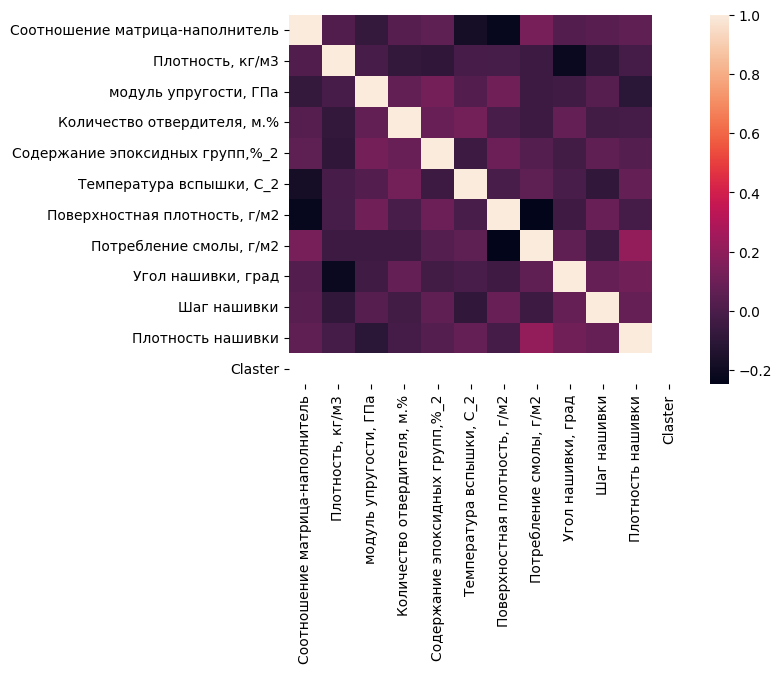

In [58]:
sns.heatmap(ds_clasters_cor_1)

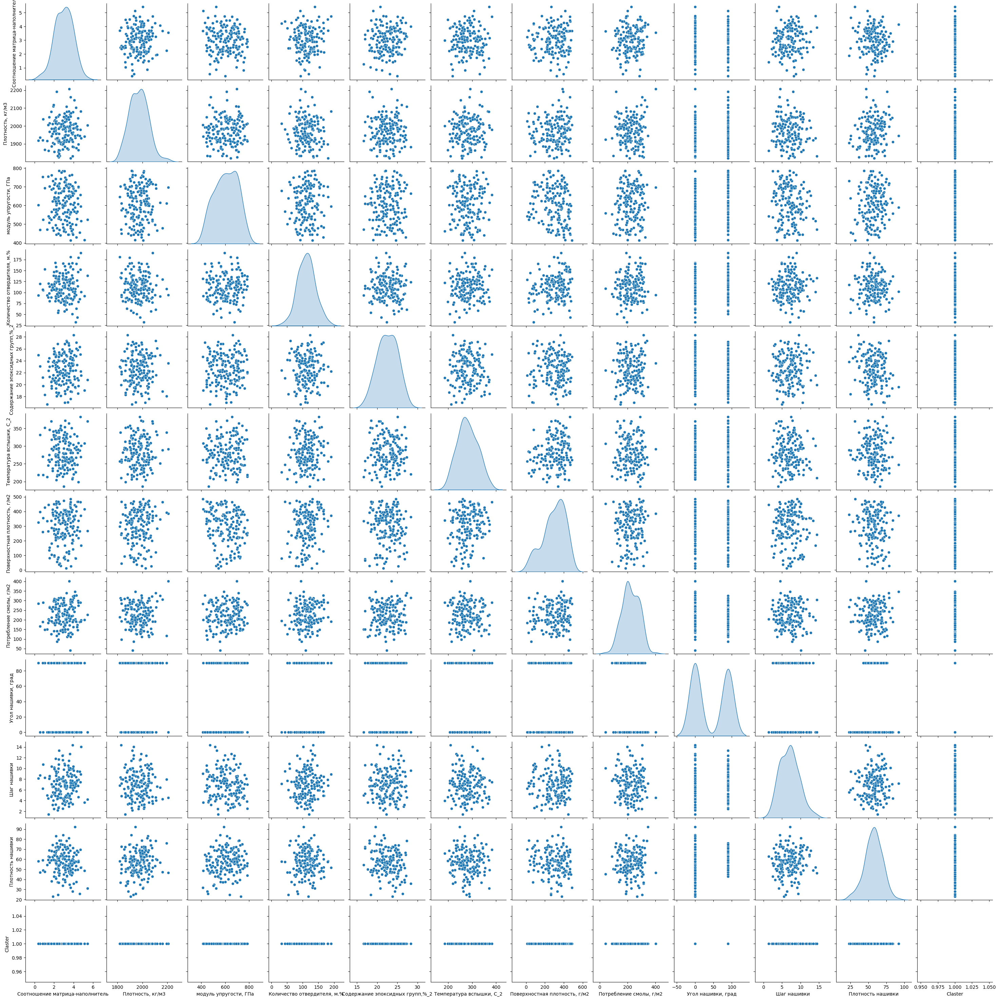

In [59]:
sns.pairplot(ds_by_clusters[1], diag_kind='kde')

### Анализ кластера 3

In [60]:
ds_by_clusters[2].shape

(132, 12)

In [61]:
ds_clasters_cor_2 = ds_by_clusters[2].corr()
ds_clasters_cor_2

,Соотношение матрица-наполнитель,"Плотность, кг/м3","модуль упругости, ГПа","Количество отвердителя, м.%","Содержание эпоксидных групп,%_2","Температура вспышки, С_2","Поверхностная плотность, г/м2","Потребление смолы, г/м2","Угол нашивки, град",Шаг нашивки,Плотность нашивки,Claster
Соотношение матрица-наполнитель,1.000000,0.014485,-0.073354,0.030185,0.056436,-0.175454,-0.228575,0.128688,0.023483,0.041593,0.063466,NaN
"Плотность, кг/м3",0.014485,1.000000,-0.010894,-0.080836,-0.090377,-0.013658,-0.016661,-0.046957,-0.215063,-0.084685,-0.022825,NaN
"модуль упругости, ГПа",-0.073354,-0.010894,1.000000,0.065435,0.125971,0.020286,0.112775,-0.044552,-0.034270,0.030672,-0.108470,NaN
"Количество отвердителя, м.%",0.030185,-0.080836,0.065435,1.000000,0.086277,0.118622,-0.006063,-0.046232,0.078439,-0.024890,-0.023694,NaN
"Содержание эпоксидных групп,%_2",0.056436,-0.090377,0.125971,0.086277,1.000000,-0.051583,0.097289,0.028954,-0.024098,0.062975,0.027851,NaN
"Температура вспышки, С_2",-0.175454,-0.013658,0.020286,0.118622,-0.051583,1.000000,-0.004837,0.057981,-0.008215,-0.082981,0.076087,NaN
"Поверхностная плотность, г/м2",-0.228575,-0.016661,0.112775,-0.006063,0.097289,-0.004837,1.000000,-0.248166,-0.043239,0.085573,-0.022217,NaN
"Потребление смолы, г/м2",0.128688,-0.046957,-0.044552,-0.046232,0.028954,0.057981,-0.248166,1.000000,0.061032,-0.048547,0.214529,NaN
"Угол нашивки, град",0.023483,-0.215063,-0.034270,0.078439,-0.024098,-0.008215,-0.043239,0.061032,1.000000,0.082777,0.116869,NaN
Шаг нашивки,0.041593,-0.084685,0.030672,-0.024890,0.062975,-0.082981,0.085573,-0.048547,0.082777,1.000000,0.082722,NaN


<Axes: >

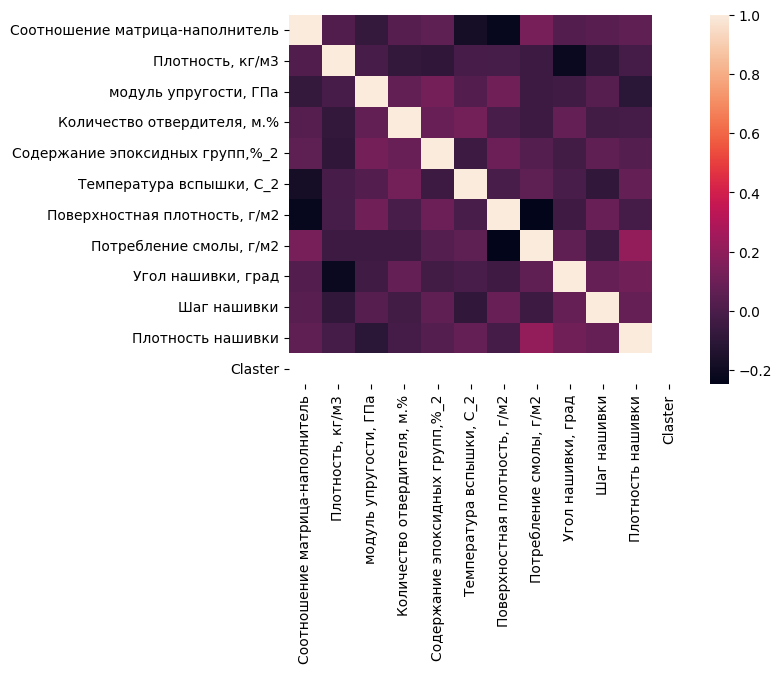

In [62]:
sns.heatmap(ds_clasters_cor_2)

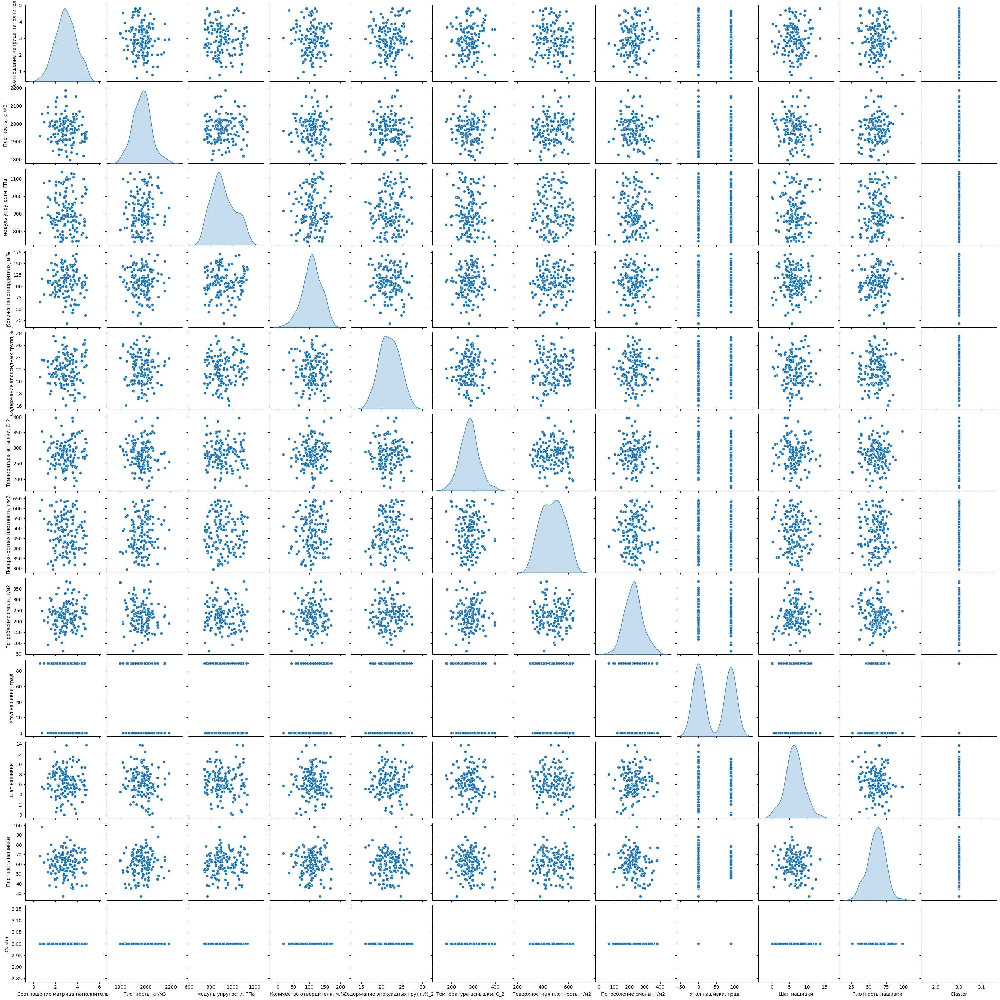

In [63]:
sns.pairplot(ds_by_clusters[3], diag_kind='kde')

### Анализ кластера 4

In [64]:
ds_by_clusters[3].shape

(142, 12)

In [65]:
ds_clasters_cor_3 = ds_by_clusters[3].corr()
ds_clasters_cor_3

,Соотношение матрица-наполнитель,"Плотность, кг/м3","модуль упругости, ГПа","Количество отвердителя, м.%","Содержание эпоксидных групп,%_2","Температура вспышки, С_2","Поверхностная плотность, г/м2","Потребление смолы, г/м2","Угол нашивки, град",Шаг нашивки,Плотность нашивки,Claster
Соотношение матрица-наполнитель,1.000000,-0.128211,-0.029511,-0.036311,0.053262,0.060998,-0.090042,0.077709,-0.143486,-0.029624,-0.057214,NaN
"Плотность, кг/м3",-0.128211,1.000000,0.069185,0.008579,-0.020186,-0.035417,0.136775,-0.138651,-0.083860,-0.096233,0.110856,NaN
"модуль упругости, ГПа",-0.029511,0.069185,1.000000,0.038721,0.105492,-0.060736,-0.005720,-0.020419,-0.150090,-0.014718,0.056943,NaN
"Количество отвердителя, м.%",-0.036311,0.008579,0.038721,1.000000,-0.051352,0.051836,0.063153,0.024096,0.062518,-0.002054,-0.000197,NaN
"Содержание эпоксидных групп,%_2",0.053262,-0.020186,0.105492,-0.051352,1.000000,0.035232,0.095943,-0.041165,0.060566,-0.026221,-0.006334,NaN
"Температура вспышки, С_2",0.060998,-0.035417,-0.060736,0.051836,0.035232,1.000000,0.001542,0.023950,-0.088725,-0.052597,-0.061926,NaN
"Поверхностная плотность, г/м2",-0.090042,0.136775,-0.005720,0.063153,0.095943,0.001542,1.000000,0.039198,-0.011965,-0.076108,0.002645,NaN
"Потребление смолы, г/м2",0.077709,-0.138651,-0.020419,0.024096,-0.041165,0.023950,0.039198,1.000000,-0.088269,0.117194,-0.158491,NaN
"Угол нашивки, град",-0.143486,-0.083860,-0.150090,0.062518,0.060566,-0.088725,-0.011965,-0.088269,1.000000,-0.010851,0.015319,NaN
Шаг нашивки,-0.029624,-0.096233,-0.014718,-0.002054,-0.026221,-0.052597,-0.076108,0.117194,-0.010851,1.000000,-0.109251,NaN


<Axes: >

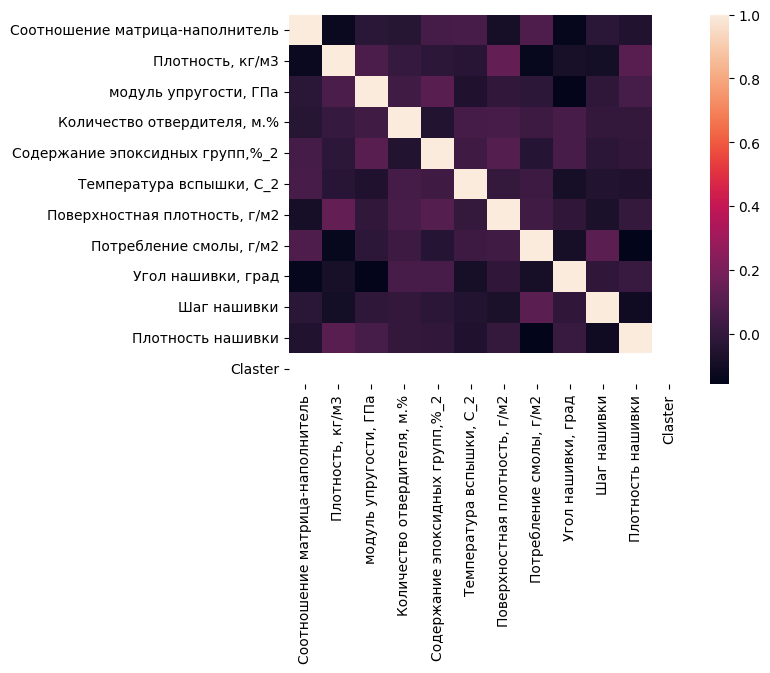

In [66]:
sns.heatmap(ds_clasters_cor_3)

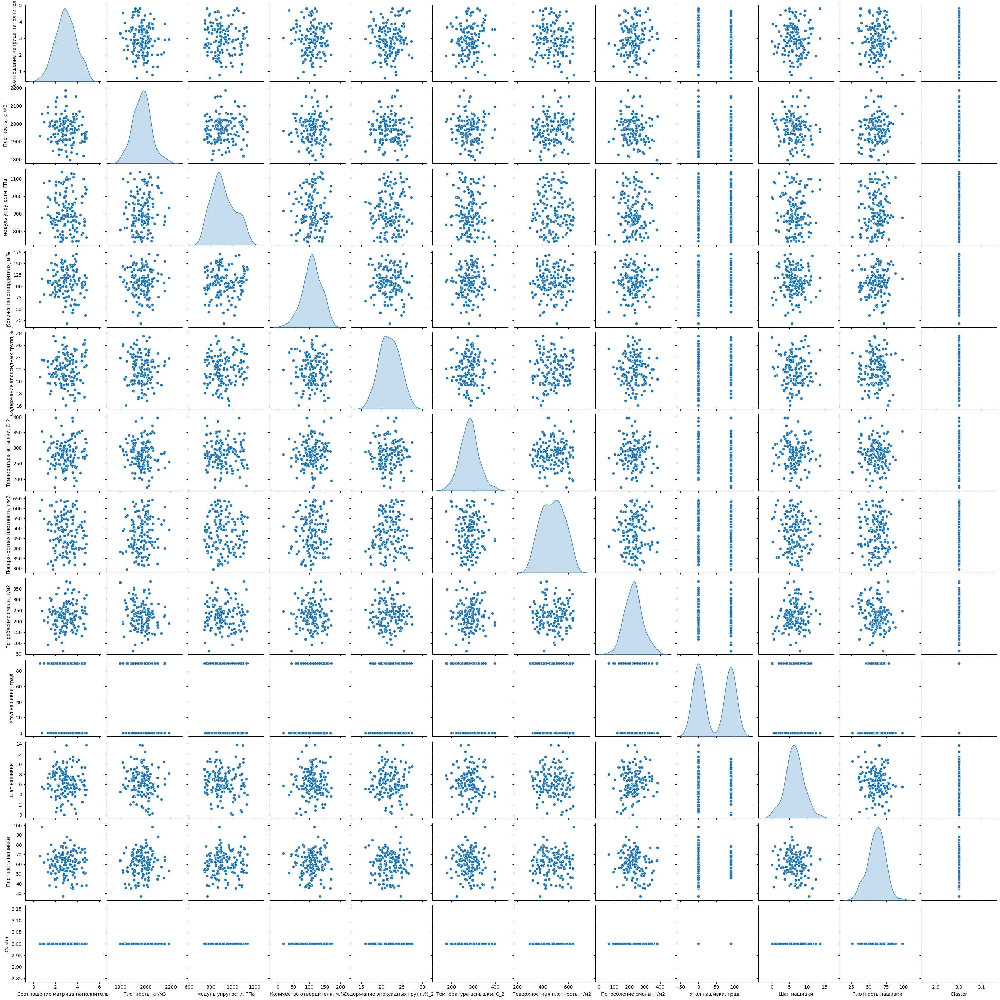

In [67]:
sns.pairplot(ds_by_clusters[3], diag_kind='kde')

### Анализ кластера 5

In [68]:
ds_by_clusters[4].shape

(109, 12)

In [69]:
ds_clasters_cor_4 = ds_by_clusters[4].corr()
ds_clasters_cor_4

,Соотношение матрица-наполнитель,"Плотность, кг/м3","модуль упругости, ГПа","Количество отвердителя, м.%","Содержание эпоксидных групп,%_2","Температура вспышки, С_2","Поверхностная плотность, г/м2","Потребление смолы, г/м2","Угол нашивки, град",Шаг нашивки,Плотность нашивки,Claster
Соотношение матрица-наполнитель,1.000000,0.039651,-0.008454,-0.105406,-0.033867,-0.180756,0.083262,0.018256,-0.206011,0.039100,-0.109923,NaN
"Плотность, кг/м3",0.039651,1.000000,-0.133681,-0.134727,0.023095,-0.062962,0.022289,0.021755,-0.108105,0.039405,-0.046212,NaN
"модуль упругости, ГПа",-0.008454,-0.133681,1.000000,0.046107,-0.007449,-0.199846,-0.086684,0.030011,-0.020258,0.038240,-0.102715,NaN
"Количество отвердителя, м.%",-0.105406,-0.134727,0.046107,1.000000,-0.059939,0.159715,-0.139133,-0.009721,-0.058652,-0.017880,-0.087695,NaN
"Содержание эпоксидных групп,%_2",-0.033867,0.023095,-0.007449,-0.059939,1.000000,-0.015043,0.087293,0.018993,-0.009366,0.058271,-0.087766,NaN
"Температура вспышки, С_2",-0.180756,-0.062962,-0.199846,0.159715,-0.015043,1.000000,0.033279,0.152402,0.196507,0.131839,0.077340,NaN
"Поверхностная плотность, г/м2",0.083262,0.022289,-0.086684,-0.139133,0.087293,0.033279,1.000000,-0.127341,0.117564,0.071089,-0.016234,NaN
"Потребление смолы, г/м2",0.018256,0.021755,0.030011,-0.009721,0.018993,0.152402,-0.127341,1.000000,-0.038101,-0.014073,-0.141650,NaN
"Угол нашивки, град",-0.206011,-0.108105,-0.020258,-0.058652,-0.009366,0.196507,0.117564,-0.038101,1.000000,0.129392,0.190440,NaN
Шаг нашивки,0.039100,0.039405,0.038240,-0.017880,0.058271,0.131839,0.071089,-0.014073,0.129392,1.000000,0.009267,NaN


<Axes: >

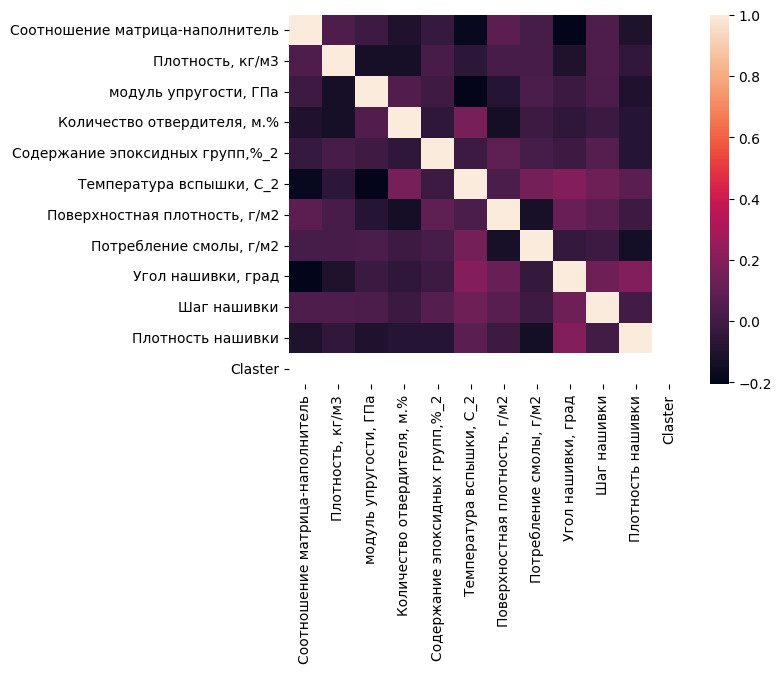

In [70]:
sns.heatmap(ds_clasters_cor_4)

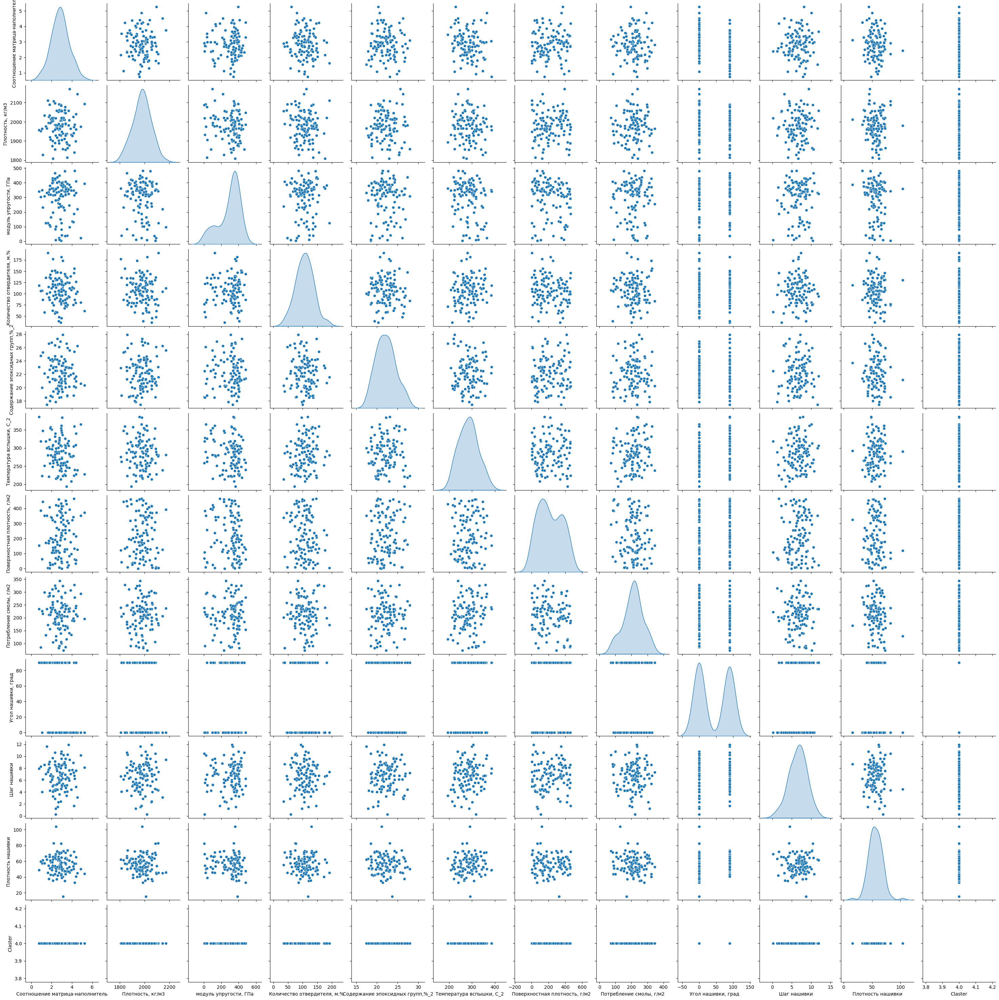

In [71]:
sns.pairplot(ds_by_clusters[4], diag_kind='kde')

### Анализ кластера 6

In [72]:
ds_by_clusters[5].shape

(83, 12)

In [73]:
ds_clasters_cor_5 = ds_by_clusters[5].corr()
ds_clasters_cor_5

,Соотношение матрица-наполнитель,"Плотность, кг/м3","модуль упругости, ГПа","Количество отвердителя, м.%","Содержание эпоксидных групп,%_2","Температура вспышки, С_2","Поверхностная плотность, г/м2","Потребление смолы, г/м2","Угол нашивки, град",Шаг нашивки,Плотность нашивки,Claster
Соотношение матрица-наполнитель,1.000000,0.094079,0.113537,-0.075469,-0.136386,0.011463,-0.049510,-0.110812,-0.019616,-0.007313,-0.119788,NaN
"Плотность, кг/м3",0.094079,1.000000,0.036638,-0.162682,0.081135,-0.052611,-0.144442,-0.107051,-0.112704,-0.187913,0.066811,NaN
"модуль упругости, ГПа",0.113537,0.036638,1.000000,0.090055,-0.049895,0.076874,-0.086948,-0.014475,0.040624,-0.198945,-0.049163,NaN
"Количество отвердителя, м.%",-0.075469,-0.162682,0.090055,1.000000,0.138847,0.161644,0.062750,0.197544,0.064467,-0.066778,0.204308,NaN
"Содержание эпоксидных групп,%_2",-0.136386,0.081135,-0.049895,0.138847,1.000000,-0.035627,0.190858,-0.071478,-0.035569,-0.138321,-0.099170,NaN
"Температура вспышки, С_2",0.011463,-0.052611,0.076874,0.161644,-0.035627,1.000000,0.009495,0.296195,0.115782,-0.013887,0.128540,NaN
"Поверхностная плотность, г/м2",-0.049510,-0.144442,-0.086948,0.062750,0.190858,0.009495,1.000000,0.019656,-0.075537,0.030444,-0.154577,NaN
"Потребление смолы, г/м2",-0.110812,-0.107051,-0.014475,0.197544,-0.071478,0.296195,0.019656,1.000000,0.173454,0.132675,0.262515,NaN
"Угол нашивки, град",-0.019616,-0.112704,0.040624,0.064467,-0.035569,0.115782,-0.075537,0.173454,1.000000,-0.028137,0.245764,NaN
Шаг нашивки,-0.007313,-0.187913,-0.198945,-0.066778,-0.138321,-0.013887,0.030444,0.132675,-0.028137,1.000000,-0.035594,NaN


<Axes: >

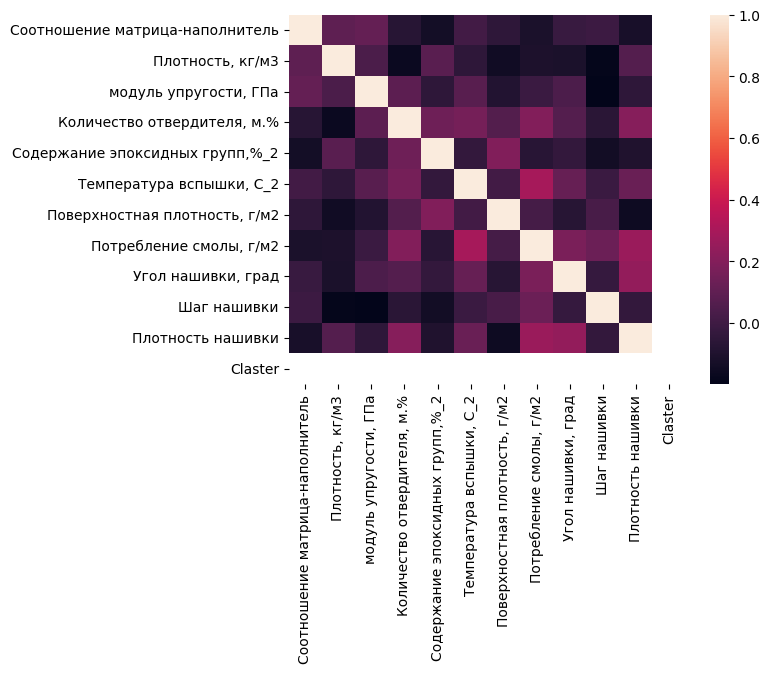

In [74]:
sns.heatmap(ds_clasters_cor_5)

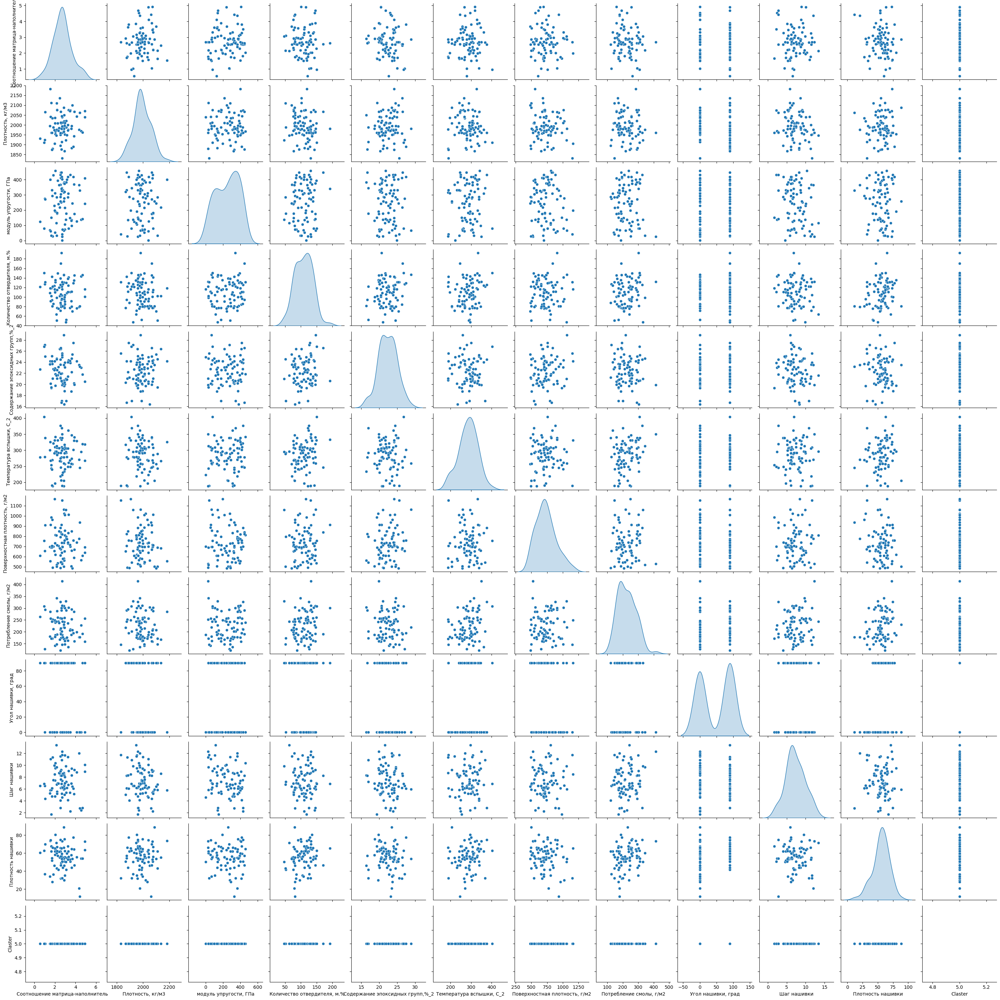

In [75]:
sns.pairplot(ds_by_clusters[5], diag_kind='kde')

### Анализ кластера 7

In [76]:
ds_by_clusters[6].shape

(74, 12)

In [77]:
ds_clasters_cor_6 = ds_by_clusters[6].corr()
ds_clasters_cor_6

,Соотношение матрица-наполнитель,"Плотность, кг/м3","модуль упругости, ГПа","Количество отвердителя, м.%","Содержание эпоксидных групп,%_2","Температура вспышки, С_2","Поверхностная плотность, г/м2","Потребление смолы, г/м2","Угол нашивки, град",Шаг нашивки,Плотность нашивки,Claster
Соотношение матрица-наполнитель,1.000000,-0.048005,-0.007057,0.072201,-0.077174,0.198817,0.055381,0.126973,-0.055956,-0.036345,0.012288,NaN
"Плотность, кг/м3",-0.048005,1.000000,-0.118511,-0.029720,-0.274526,-0.023918,0.032251,-0.140432,-0.194919,-0.031683,0.090803,NaN
"модуль упругости, ГПа",-0.007057,-0.118511,1.000000,-0.017645,-0.010010,0.027133,-0.204517,-0.089898,0.128878,-0.045687,0.038578,NaN
"Количество отвердителя, м.%",0.072201,-0.029720,-0.017645,1.000000,0.016686,-0.079315,-0.039025,-0.045447,-0.158554,0.098052,0.048625,NaN
"Содержание эпоксидных групп,%_2",-0.077174,-0.274526,-0.010010,0.016686,1.000000,-0.165396,-0.077022,-0.052485,0.116408,0.195668,0.115999,NaN
"Температура вспышки, С_2",0.198817,-0.023918,0.027133,-0.079315,-0.165396,1.000000,-0.117580,0.250974,-0.015726,0.022350,-0.046733,NaN
"Поверхностная плотность, г/м2",0.055381,0.032251,-0.204517,-0.039025,-0.077022,-0.117580,1.000000,0.102188,0.092734,0.106140,0.082389,NaN
"Потребление смолы, г/м2",0.126973,-0.140432,-0.089898,-0.045447,-0.052485,0.250974,0.102188,1.000000,0.055150,-0.040453,-0.260406,NaN
"Угол нашивки, град",-0.055956,-0.194919,0.128878,-0.158554,0.116408,-0.015726,0.092734,0.055150,1.000000,-0.064471,0.075483,NaN
Шаг нашивки,-0.036345,-0.031683,-0.045687,0.098052,0.195668,0.022350,0.106140,-0.040453,-0.064471,1.000000,0.235497,NaN


<Axes: >

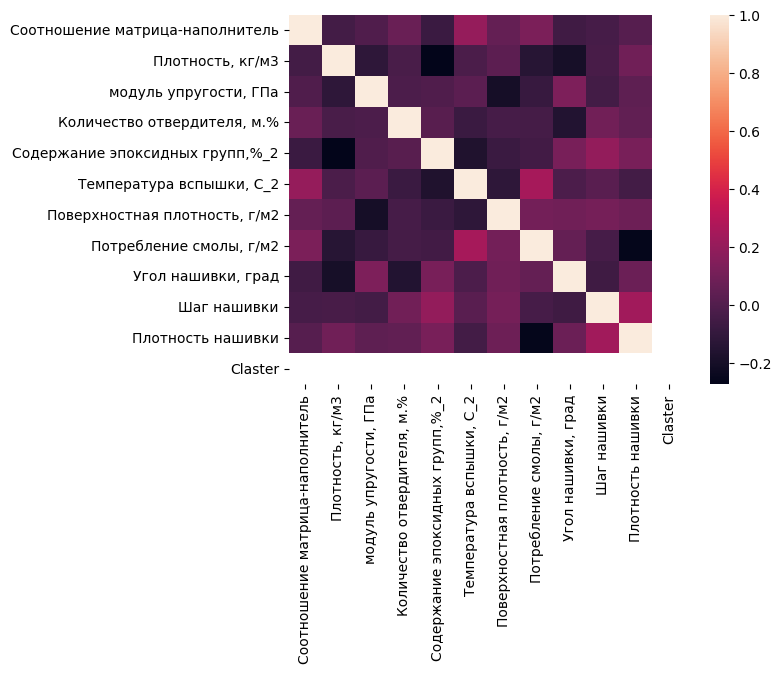

In [78]:
sns.heatmap(ds_clasters_cor_6)

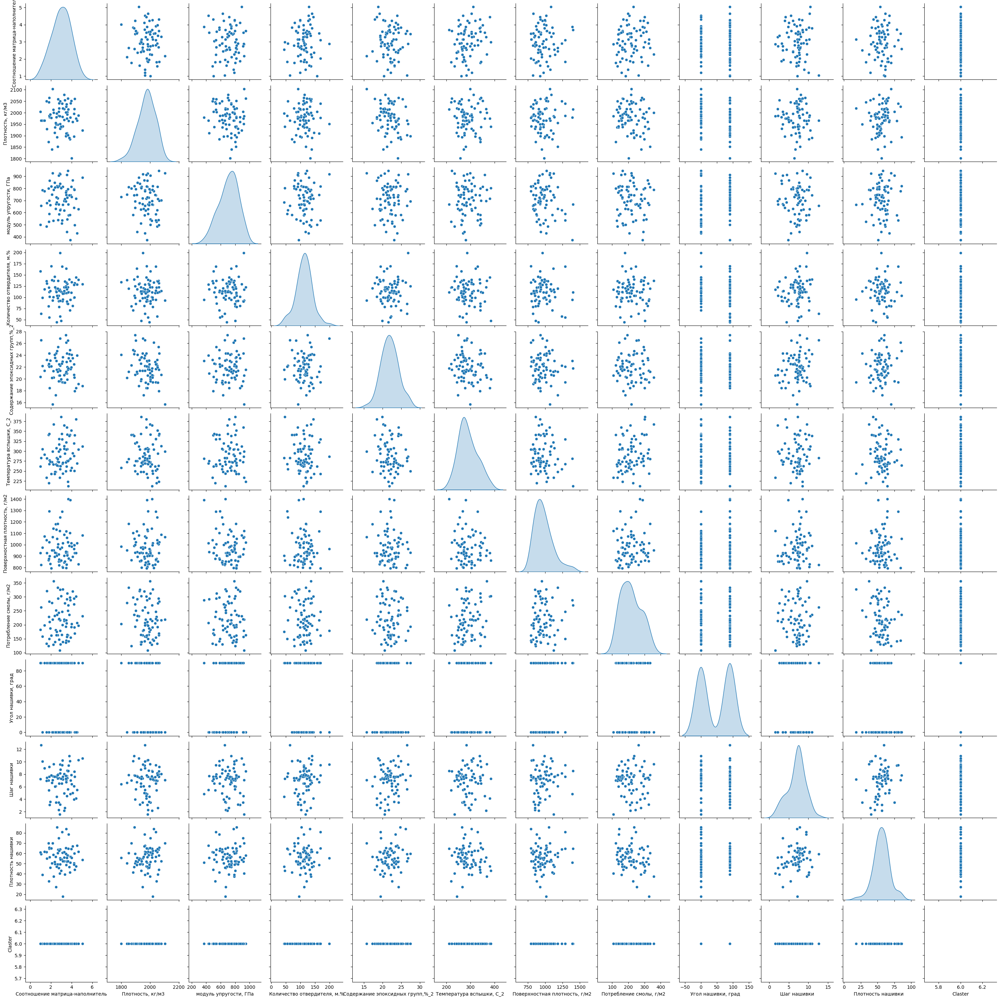

In [79]:
sns.pairplot(ds_by_clusters[6], diag_kind='kde')

### Анализ кластера 8

In [80]:
ds_by_clusters[7].shape

(92, 12)

In [81]:
ds_clasters_cor_7 = ds_by_clusters[7].corr()
ds_clasters_cor_7

,Соотношение матрица-наполнитель,"Плотность, кг/м3","модуль упругости, ГПа","Количество отвердителя, м.%","Содержание эпоксидных групп,%_2","Температура вспышки, С_2","Поверхностная плотность, г/м2","Потребление смолы, г/м2","Угол нашивки, град",Шаг нашивки,Плотность нашивки,Claster
Соотношение матрица-наполнитель,1.000000,0.032417,0.216792,0.040243,0.086537,0.050466,-0.015292,0.171707,0.263647,0.008815,0.319507,NaN
"Плотность, кг/м3",0.032417,1.000000,-0.053794,0.014983,0.236491,0.129364,-0.044850,-0.055793,-0.058693,-0.034219,0.186888,NaN
"модуль упругости, ГПа",0.216792,-0.053794,1.000000,0.035072,0.003597,0.088965,0.124340,0.032761,0.089412,0.119835,0.142061,NaN
"Количество отвердителя, м.%",0.040243,0.014983,0.035072,1.000000,-0.093514,0.174649,0.145259,-0.060858,-0.055598,0.043133,-0.002362,NaN
"Содержание эпоксидных групп,%_2",0.086537,0.236491,0.003597,-0.093514,1.000000,0.089819,-0.042578,0.056335,0.200256,-0.033751,-0.029488,NaN
"Температура вспышки, С_2",0.050466,0.129364,0.088965,0.174649,0.089819,1.000000,-0.156274,0.107351,0.003710,0.200650,0.095733,NaN
"Поверхностная плотность, г/м2",-0.015292,-0.044850,0.124340,0.145259,-0.042578,-0.156274,1.000000,-0.055042,0.016999,0.150371,-0.084140,NaN
"Потребление смолы, г/м2",0.171707,-0.055793,0.032761,-0.060858,0.056335,0.107351,-0.055042,1.000000,0.133750,-0.023789,0.071114,NaN
"Угол нашивки, град",0.263647,-0.058693,0.089412,-0.055598,0.200256,0.003710,0.016999,0.133750,1.000000,-0.155483,0.042693,NaN
Шаг нашивки,0.008815,-0.034219,0.119835,0.043133,-0.033751,0.200650,0.150371,-0.023789,-0.155483,1.000000,-0.027973,NaN


<Axes: >

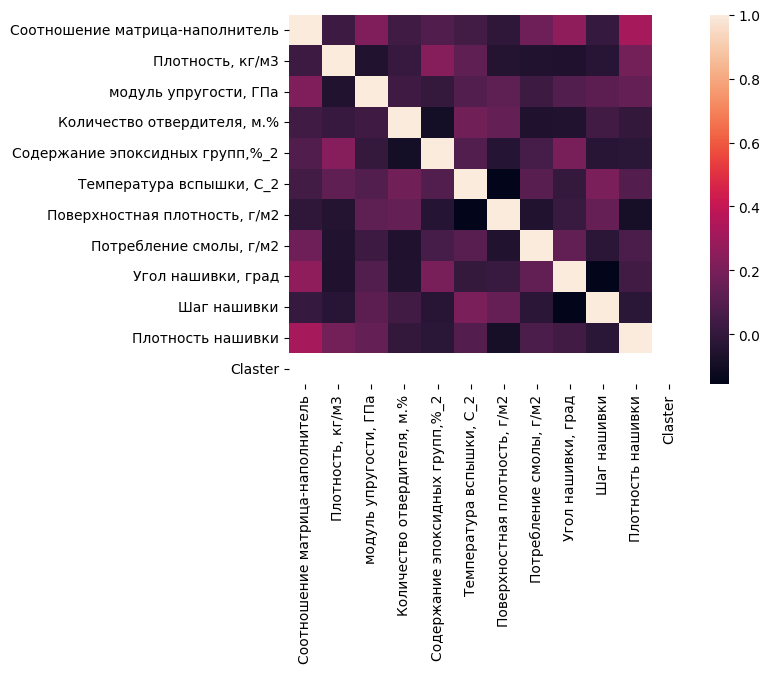

In [82]:
sns.heatmap(ds_clasters_cor_7)

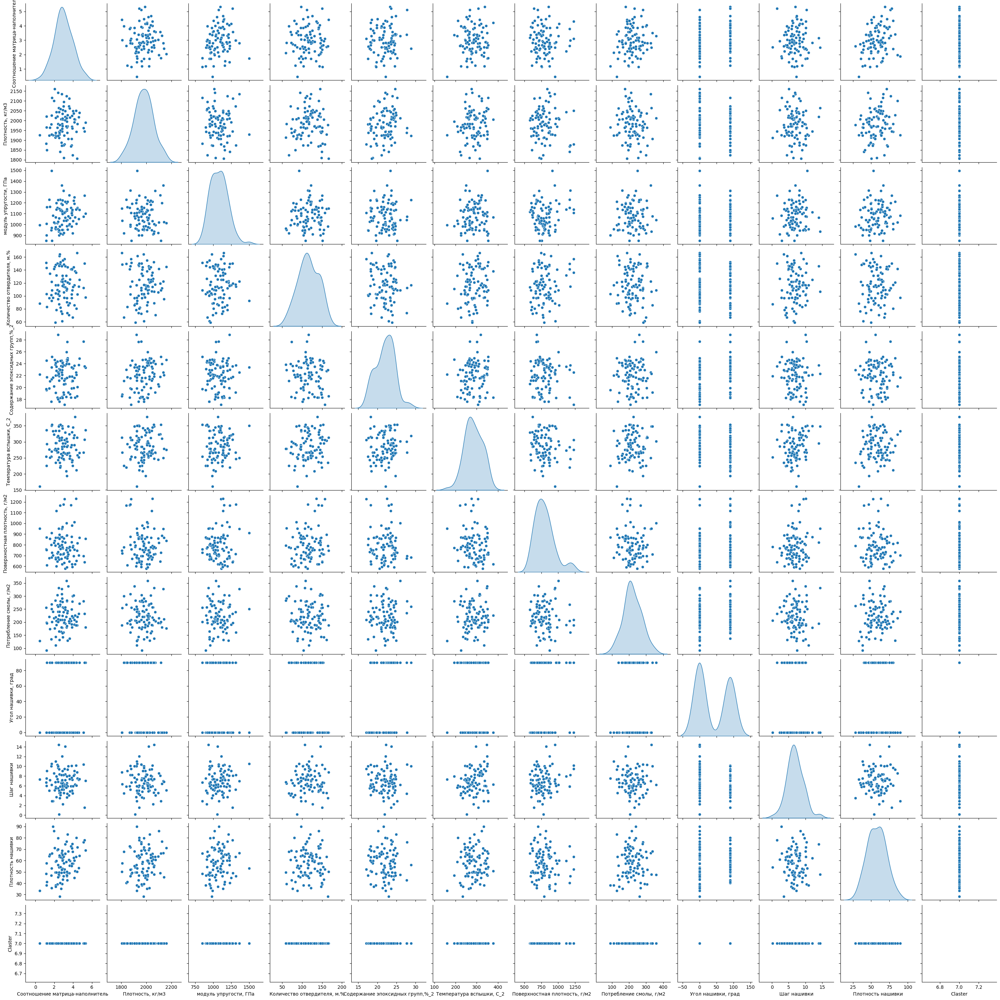

In [83]:
sns.pairplot(ds_by_clusters[7], diag_kind='kde')

### Анализ кластера 9

In [84]:
ds_by_clusters[8].shape

(133, 12)

In [85]:
ds_clasters_cor_8 = ds_by_clusters[8].corr()
ds_clasters_cor_8

,Соотношение матрица-наполнитель,"Плотность, кг/м3","модуль упругости, ГПа","Количество отвердителя, м.%","Содержание эпоксидных групп,%_2","Температура вспышки, С_2","Поверхностная плотность, г/м2","Потребление смолы, г/м2","Угол нашивки, град",Шаг нашивки,Плотность нашивки,Claster
Соотношение матрица-наполнитель,1.000000,-0.020670,-0.130997,-0.093900,0.035427,-0.055632,-0.144295,0.144317,-0.091137,0.064103,-0.034019,NaN
"Плотность, кг/м3",-0.020670,1.000000,-0.038027,0.162604,-0.041020,-0.095247,0.112759,0.018430,0.077365,-0.012714,0.050402,NaN
"модуль упругости, ГПа",-0.130997,-0.038027,1.000000,-0.000339,-0.006754,0.199136,-0.036542,-0.050445,-0.102107,-0.022657,-0.048180,NaN
"Количество отвердителя, м.%",-0.093900,0.162604,-0.000339,1.000000,0.046968,0.002238,-0.005449,-0.026055,0.098537,-0.053563,0.049594,NaN
"Содержание эпоксидных групп,%_2",0.035427,-0.041020,-0.006754,0.046968,1.000000,-0.097263,0.140157,0.053739,-0.077112,-0.113753,0.017715,NaN
"Температура вспышки, С_2",-0.055632,-0.095247,0.199136,0.002238,-0.097263,1.000000,0.080904,-0.046934,0.038637,0.115511,-0.037412,NaN
"Поверхностная плотность, г/м2",-0.144295,0.112759,-0.036542,-0.005449,0.140157,0.080904,1.000000,0.063195,0.042370,0.041281,0.058442,NaN
"Потребление смолы, г/м2",0.144317,0.018430,-0.050445,-0.026055,0.053739,-0.046934,0.063195,1.000000,-0.103049,-0.046183,0.010134,NaN
"Угол нашивки, град",-0.091137,0.077365,-0.102107,0.098537,-0.077112,0.038637,0.042370,-0.103049,1.000000,0.069823,0.118602,NaN
Шаг нашивки,0.064103,-0.012714,-0.022657,-0.053563,-0.113753,0.115511,0.041281,-0.046183,0.069823,1.000000,-0.096925,NaN


<Axes: >

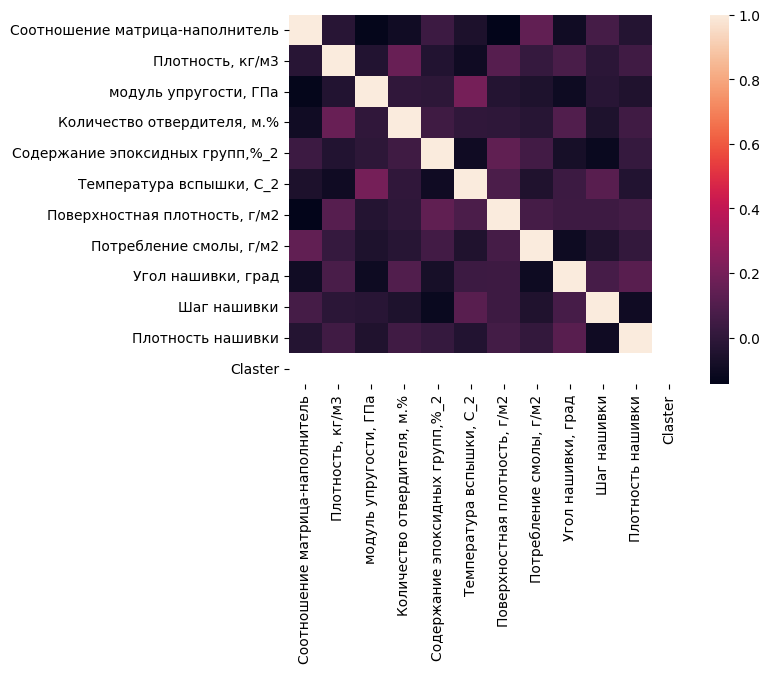

In [86]:
sns.heatmap(ds_clasters_cor_8)

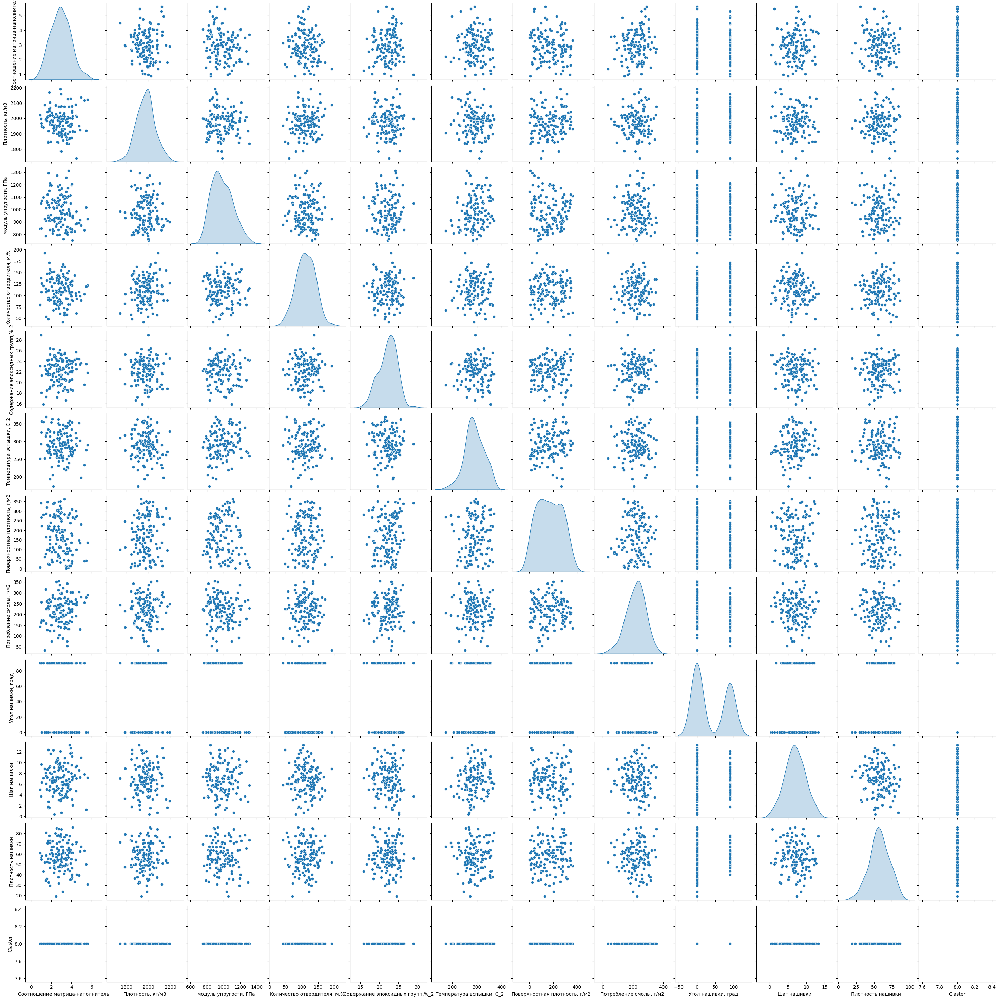

In [87]:
sns.pairplot(ds_by_clusters[8], diag_kind='kde')

## Выводы

# Обучим и сравним регрессионные модели

In [88]:
# Get train and test sets
x = df
y = Y_1
x_train, x_test, y_train, y_test = train_test_split(x, y, train_size=0.8)

In [89]:
regressor = DecisionTreeRegressor()
regressor.fit(x_train, y_train)

DecisionTreeRegressor()

In [90]:
y_pred = regressor.predict(x_test)

In [91]:
print((y_test, y_pred))

(545    72.841069
476    71.908482
462    71.934726
54     69.802191
638    77.762205
         ...    
955    73.385782
941    70.505913
393    74.064903
810    76.567278
447    73.528438
Name: Модуль упругости при растяжении, ГПа, Length: 200, dtype: float64, array([74.77048666, 73.34746511, 76.66382724, 71.92449478, 69.72909465,
       78.7616276 , 74.86201224, 76.17595166, 66.42107006, 75.23099401,
       74.02639855, 74.24435417, 71.97166872, 66.05274662, 75.23099401,
       69.1025593 , 71.0395502 , 77.88847586, 74.71883227, 78.62942208,
       74.82190158, 72.51547633, 75.67565704, 66.26528996, 74.53658956,
       70.83830664, 76.2068517 , 70.28693977, 77.88847586, 74.44388466,
       73.54312848, 68.53559885, 71.29504356, 70.7808016 , 72.45449548,
       77.81820291, 74.99543948, 74.00681617, 74.99543948, 72.45449548,
       67.72896725, 78.13978495, 68.9383679 , 73.59789714, 67.72896725,
       73.53766298, 75.40391812, 72.60154997, 77.19045193, 76.17595166,
       73.08740668,

In [92]:
MAE = mean_absolute_error(y_test, y_pred)
MSE = mean_squared_error(y_test, y_pred)
R2 = r2_score(y_test, y_pred)

In [93]:
MAE

3.9509308613413325

In [94]:
MSE

23.997943948098065

In [95]:
R2

-1.2538627844037786

## Проведем анализ эффективности разных моделей на всех кластерах датасета

### Построение общих моделей на всем датасете (без учета кластеров)

In [96]:
models = [LinearRegression(), # метод наименьших квадратов
          RandomForestRegressor(n_estimators=100, 
                                # max_features ='sqrt',
                                criterion='poisson'), # случайный лес {“squared_error”, “absolute_error”, “friedman_mse”, “poisson”}
          KNeighborsRegressor(n_neighbors=10,
                              weights='distance'), # метод ближайших соседей {'uniform', 'distance', [callable]}
          SVR(kernel='sigmoid'), # метод опорных векторов с линейным ядром {‘linear’, ‘poly’, ‘rbf’, ‘sigmoid’, ‘precomputed’}
          # LogisticRegression(), # логистическая регрессия
          DecisionTreeRegressor(min_samples_leaf=2,
                                criterion='absolute_error') # деревья решений {“squared_error”, “friedman_mse”, “absolute_error”, “poisson”}, default=”squared_error”
          ]

In [97]:
x = df
# y = df_copy['Модуль упругости при растяжении, ГПа', 'Прочность при растяжении, МПа']
# y = Y_1 + Y_2
y = pd.concat([Y_1, Y_2], join='inner', axis=1)

In [98]:
x_train, x_test, y_train, y_test = train_test_split(x, y, train_size=0.8)

In [99]:
# Нормализуем данные
scaler = MinMaxScaler()
X_train = scaler.fit_transform(x_train)
X_test = scaler.transform(x_test)

In [100]:
y_column = y.columns

In [101]:
# создаем временные структуры
TestModels = pd.DataFrame(columns=['Model', 'R2_Y_1', 'R2_Y_2'])
tmp = {}
# для каждой модели из списка
for model in models:
    # получаем имя модели
    model_name = str(model)
    tmp['Model'] = model_name[:model_name.index('(')]  
    
    # для каждого столбцам результирующего набора
    for i in range(y_train.shape[1]):
        # текущая колонка
        current_column = y_column[i]
        # обучаем модель
        model.fit(x_train, y_train[current_column]) 
        # вычисляем коэффициент детерминации
        y_true = y_test[current_column]
        y_pred = model.predict(x_test)
        tmp[f'R2_Y_{i+1}'] = r2_score(y_true, y_pred)
        print(model_name, i+1)
    # записываем данные и итоговый DataFrame
    TestModels.loc[len(TestModels.index)] = tmp
# делаем индекс по названию модели
TestModels.set_index('Model', inplace=True)

LinearRegression() 1
LinearRegression() 2
RandomForestRegressor(criterion='poisson') 1
RandomForestRegressor(criterion='poisson') 2
KNeighborsRegressor(n_neighbors=10, weights='distance') 1
KNeighborsRegressor(n_neighbors=10, weights='distance') 2
SVR(kernel='sigmoid') 1
SVR(kernel='sigmoid') 2
DecisionTreeRegressor(criterion='absolute_error', min_samples_leaf=2) 1
DecisionTreeRegressor(criterion='absolute_error', min_samples_leaf=2) 2


In [102]:
TestModels

,R2_Y_1,R2_Y_2
Model,,
LinearRegression,0.002084,0.003893
RandomForestRegressor,-0.088787,-0.039831
KNeighborsRegressor,-0.187861,-0.130060
SVR,-0.001908,-0.003528
DecisionTreeRegressor,-0.933508,-0.821623


<Axes: title={'center': 'R2_Y2'}, xlabel='Model'>

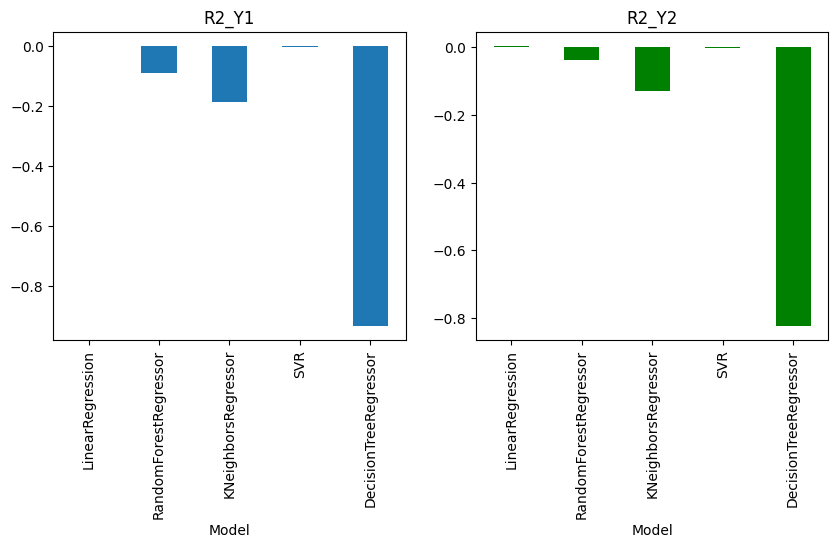

In [103]:
fig, axes = plt.subplots(ncols=2, figsize=(10,4))
TestModels.R2_Y_1.plot(ax=axes[0], kind='bar', title='R2_Y1')
TestModels.R2_Y_2.plot(ax=axes[1], kind='bar', color='green', title='R2_Y2')

### Построение моделей с учетом кластеров

In [104]:
models_by_clustrs = []
ii = 1
for cluster in ds_by_clusters:
    
    models = [LinearRegression(), # метод наименьших квадратов
              RandomForestRegressor(n_estimators=500, 
                                    max_features ='sqrt',
                                    criterion='poisson'), # случайный лес {“squared_error”, “absolute_error”, “friedman_mse”, “poisson”}
              KNeighborsRegressor(n_neighbors=5,
                                  weights='uniform'), # метод ближайших соседей {'uniform', 'distance', [callable]}
              SVR(kernel='poly'), # метод опорных векторов с линейным ядром {‘linear’, ‘poly’, ‘rbf’, ‘sigmoid’, ‘precomputed’}
              # LogisticRegression(), # логистическая регрессия
              DecisionTreeRegressor(min_samples_leaf=2,
                                    criterion='poisson') # деревья решений {“squared_error”, “friedman_mse”, “absolute_error”, “poisson”}, default=”squared_error”
              ]
    
    x = cluster
    # y = df_copy['Модуль упругости при растяжении, ГПа', 'Прочность при растяжении, МПа']
    # y = Y_1 + Y_2
    y = pd.concat([Y_1, Y_2], join='inner', axis=1)
    indexes = cluster.index
    y = y.loc[indexes]
    
    x_train, x_test, y_train, y_test = train_test_split(x, y, train_size=0.9)
    
    # Нормализуем данные
    scaler = MinMaxScaler()
    X_train = scaler.fit_transform(x_train)
    X_test = scaler.transform(x_test)
    
    y_column = y.columns
    
    # создаем временные структуры
    TestModels = pd.DataFrame(columns=['Model', 'R2_Y_1', 'R2_Y_2'])
    tmp = {}
    # для каждой модели из списка
    for model in models:
        # получаем имя модели
        model_name = str(model)
        tmp['Model'] = model_name[:model_name.index('(')]  
        
        # для каждого столбцам результирующего набора
        for i in range(y_train.shape[1]):
            # текущая колонка
            current_column = y_column[i]
            # обучаем модель
            model.fit(x_train, y_train[current_column]) 
            # вычисляем коэффициент детерминации
            y_true = y_test[current_column]
            y_pred = model.predict(x_test)
            tmp[f'R2_Y_{i+1}'] = r2_score(y_true, y_pred)
            # print(model_name, i+1)
        # записываем данные и итоговый DataFrame
        TestModels.loc[len(TestModels.index)] = tmp
    # делаем индекс по названию модели
    TestModels.set_index('Model', inplace=True)
    models_by_clustrs.append(TestModels)
    print(f'The {ii} iteration ends')
    ii+=1

The 1 iteration ends
The 2 iteration ends
The 3 iteration ends
The 4 iteration ends
The 5 iteration ends
The 6 iteration ends
The 7 iteration ends
The 8 iteration ends
The 9 iteration ends


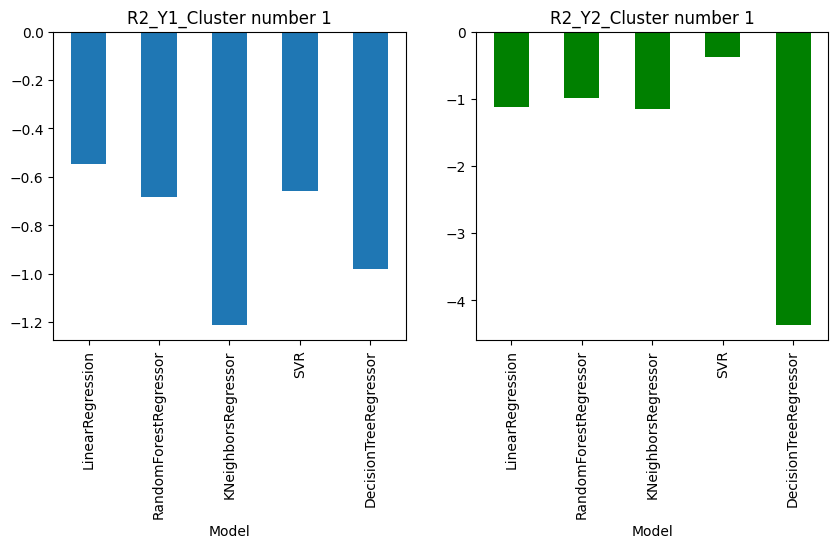

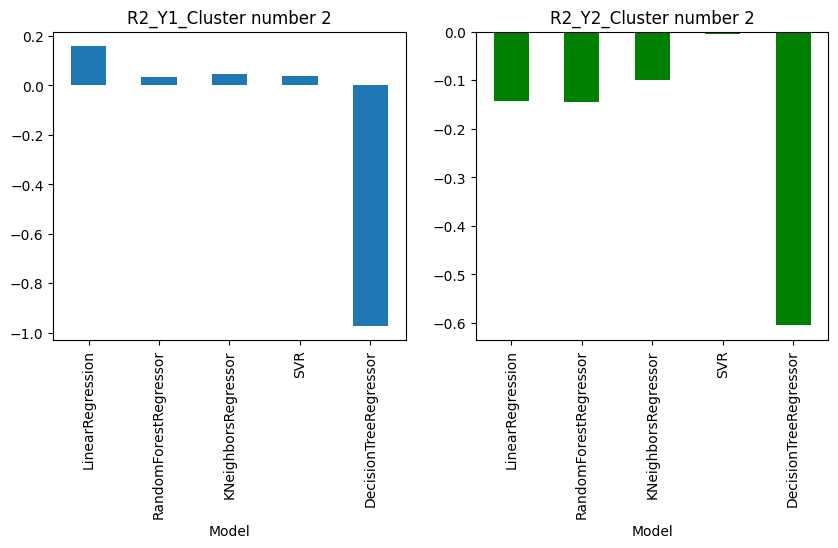

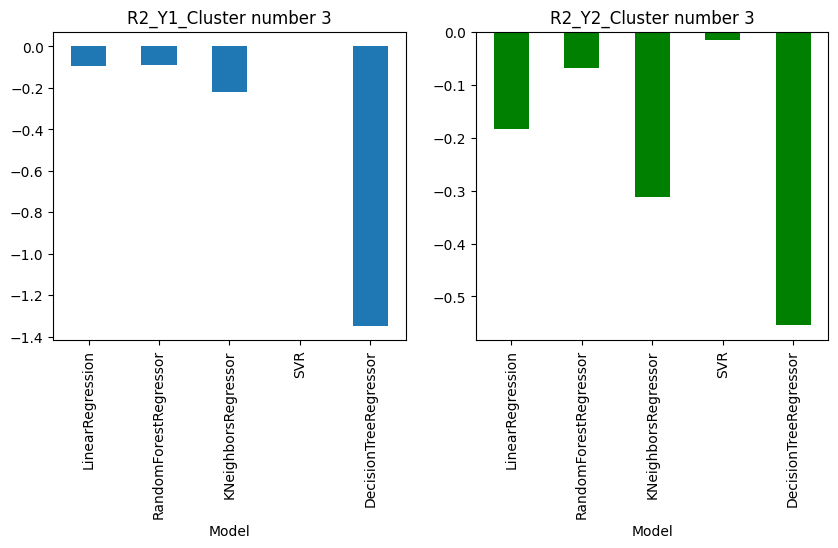

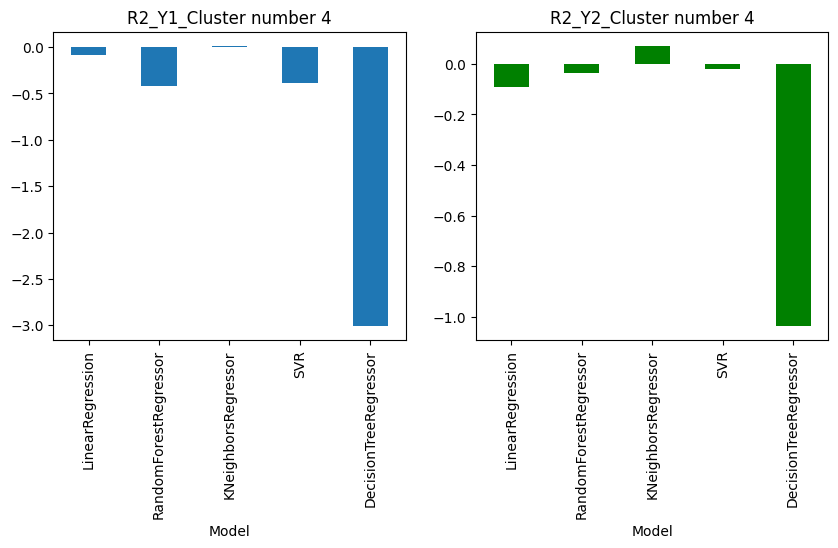

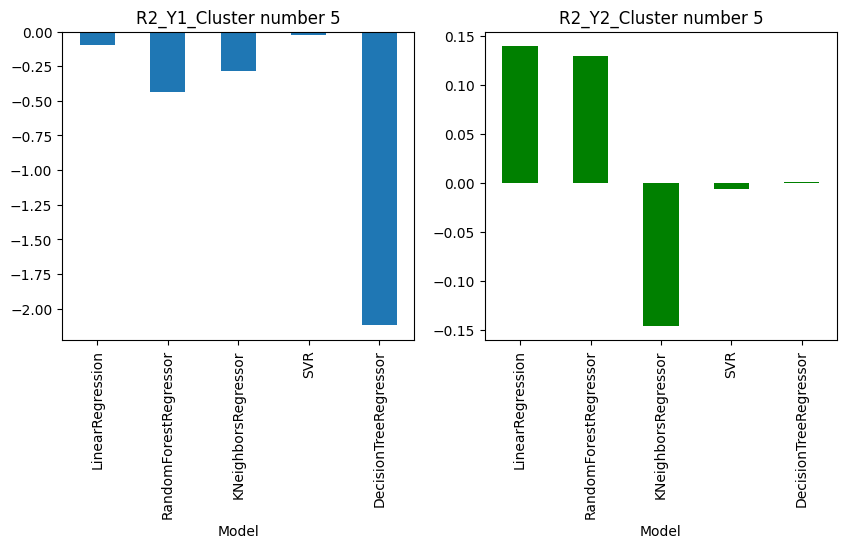

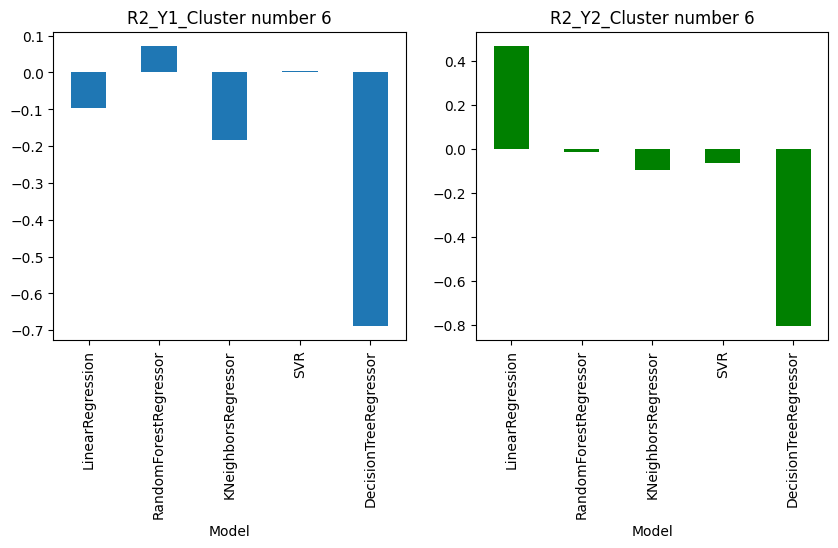

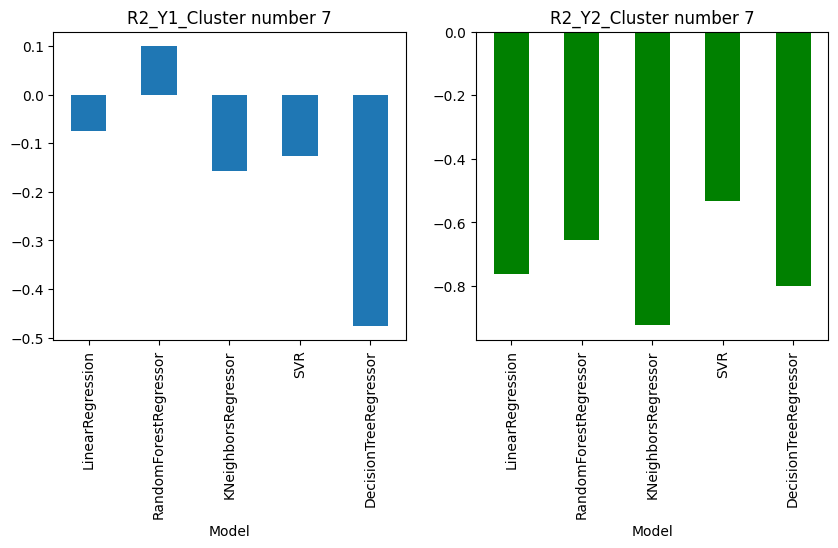

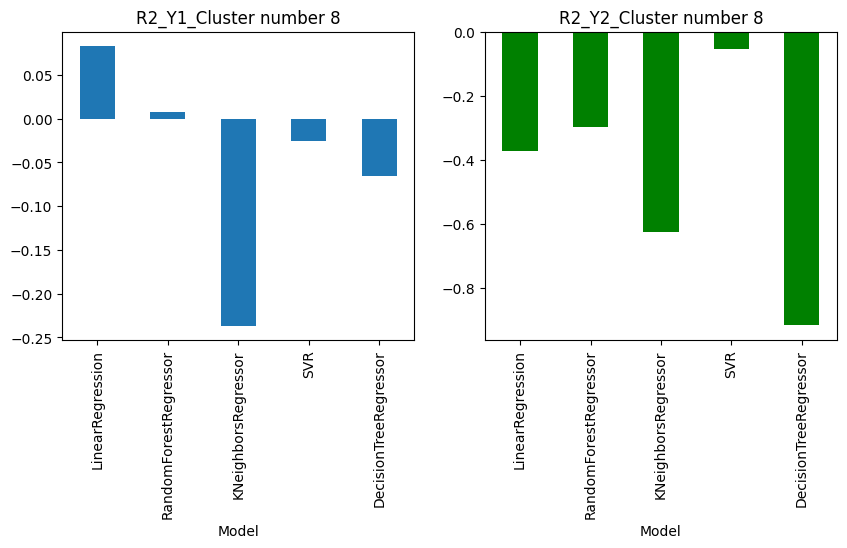

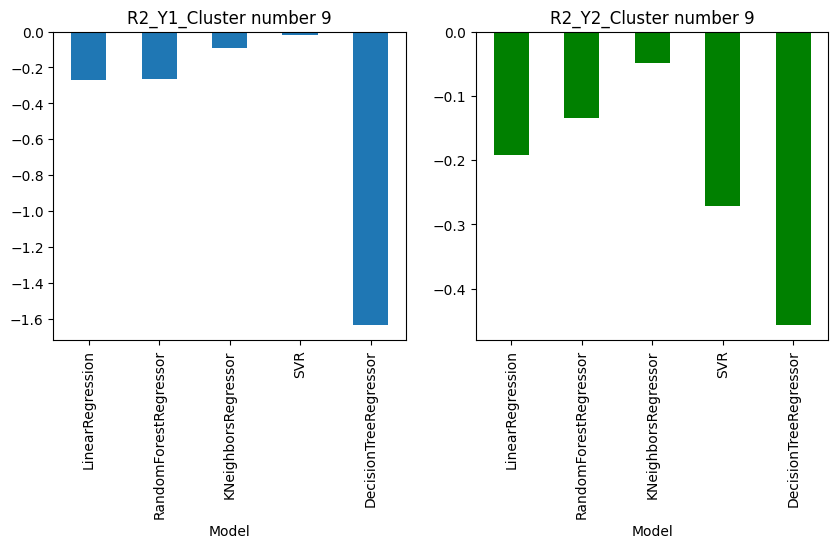

In [105]:
i = 1
for model in models_by_clustrs:
    fig, axes = plt.subplots(ncols=2, figsize=(10,4))
    model.R2_Y_1.plot(ax=axes[0], kind='bar', title=f'R2_Y1_Cluster number {i}')
    model.R2_Y_2.plot(ax=axes[1], kind='bar', color='green', title=f'R2_Y2_Cluster number {i}')
    i+=1

## Нейронные сети

In [243]:
df_for_NN = df_copy.drop('Соотношение матрица-наполнитель', axis=1)
df_for_NN['Cluster'] = kmeans_prediction
# # Transform categorical column
# OHE = OneHotEncoder(sparse_output=False)
# encodered_df = pd.DataFrame(OHE.fit_transform(df_for_NN[['Cluster']]))
# df_for_NN = df_for_NN.join(encodered_df)
# df_for_NN = df_for_NN.rename(columns={0: '0', 1: '1', 2: '2', 3: '3', 4: '4', 5: '5', 6: '6', 7: '7', 8: '8'})
# df_for_NN = df_for_NN.drop('Cluster', axis=1)
ds_by_clusters_NN = []
for n in range(0, max(np.unique(kmeans_prediction)) + 1):
    one_clusster = df_for_NN.loc[(df_for_NN['Cluster'] == n), ]
    # one_clusster = df_for_NN.loc[(df_for_NN[f'{n}'] == 1), ]
    # one_clusster = one_clusster.drop('Cluster', axis=1)
    ds_by_clusters_NN.append(one_clusster)

In [244]:
ds_by_clusters_NN[0].columns

Index(['Плотность, кг/м3', 'модуль упругости, ГПа',
       'Количество отвердителя, м.%', 'Содержание эпоксидных групп,%_2',
       'Температура вспышки, С_2', 'Поверхностная плотность, г/м2',
       'Модуль упругости при растяжении, ГПа', 'Прочность при растяжении, МПа',
       'Потребление смолы, г/м2', 'Угол нашивки, град', 'Шаг нашивки',
       'Плотность нашивки', 'Cluster'],
      dtype='object')

In [245]:
# Подготовливаем данные для тестирования
sample_for_test = [claster.sample() for claster in ds_by_clusters_NN]

In [246]:
# Удаляем примеры для тестирования из обучающего набора данных
iter = 0
ds_by_clusters_NN_without_test_samples = []
while iter != 9:
    cl = ds_by_clusters_NN[iter]
    cl = cl.drop(sample_for_test[iter].index)
    ds_by_clusters_NN_without_test_samples.append(cl)
    iter+=1

In [247]:
len(ds_by_clusters_NN_without_test_samples[0].columns.tolist())

13

Claser № 1
Model: "Class_1"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 Elu (Dense)                 (None, 16)                224       
                                                                 
 Selu_1 (Dense)              (None, 8)                 136       
                                                                 
 Selu_2 (Dense)              (None, 8)                 72        
                                                                 
 Output (Dense)              (None, 1)                 9         
                                                                 
Total params: 441 (1.72 KB)
Trainable params: 441 (1.72 KB)
Non-trainable params: 0 (0.00 Byte)
_________________________________________________________________
None


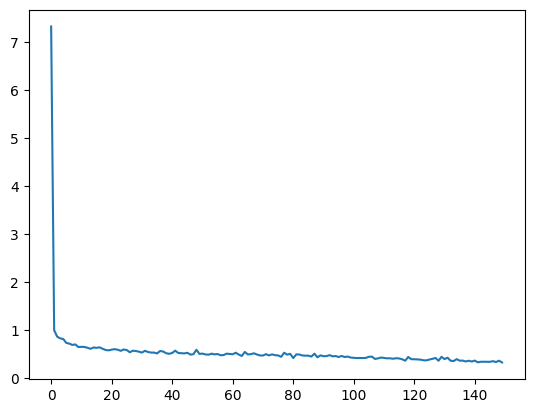

1/1 [==============================] - 0s 98ms/step


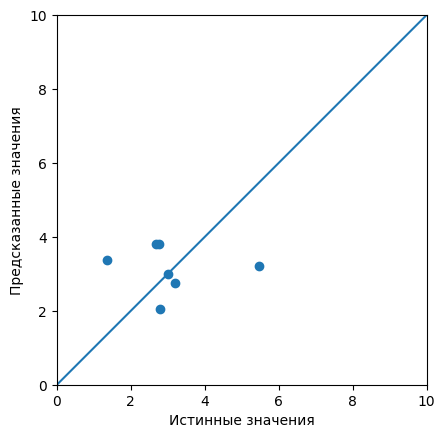

MSE: 1.726057299883385
MAE: 1.0845084271180496

    REAL
    MEAN VALUE: 3.033931215259083
    MIN VALUE: 1.36284178257415
    MAX VALUE: 5.45556617827335

    PREDICT
    MEAN VALUE: 3.1399567127227783
    MIN VALUE: 2.049043893814087
    MAX VALUE: 3.7985239028930664
Claser № 2
Model: "Class_2"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 Elu (Dense)                 (None, 16)                224       
                                                                 
 Selu_1 (Dense)              (None, 8)                 136       
                                                                 
 Selu_2 (Dense)              (None, 8)                 72        
                                                                 
 Output (Dense)              (None, 1)                 9         
                                                                 
Total params: 441 (1.72 KB)
Trainable para

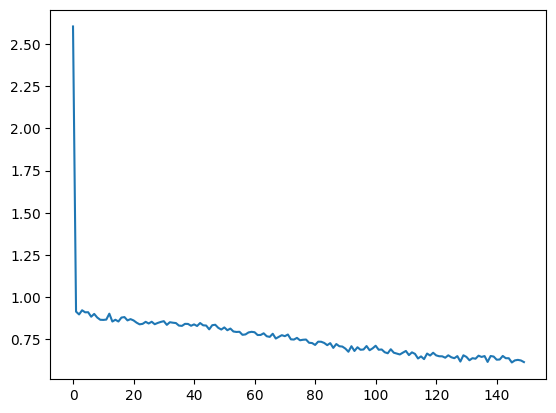

1/1 [==============================] - 0s 266ms/step


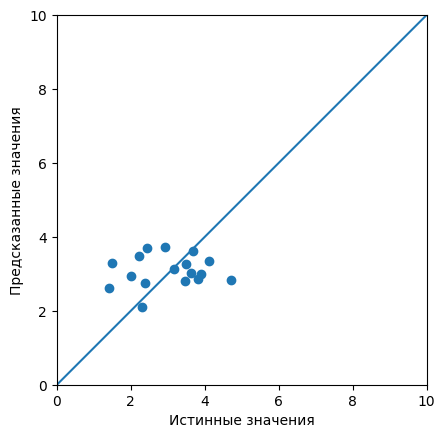

MSE: 0.9541391192833084
MAE: 0.8204983900564922

    REAL
    MEAN VALUE: 3.0113838658403034
    MIN VALUE: 1.42177758536747
    MAX VALUE: 4.70624300870484

    PREDICT
    MEAN VALUE: 3.0856916904449463
    MIN VALUE: 2.10078501701355
    MAX VALUE: 3.7242178916931152
Claser № 3
Model: "Class_3"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 Elu (Dense)                 (None, 16)                224       
                                                                 
 Selu_1 (Dense)              (None, 8)                 136       
                                                                 
 Selu_2 (Dense)              (None, 8)                 72        
                                                                 
 Output (Dense)              (None, 1)                 9         
                                                                 
Total params: 441 (1.72 KB)
Trainable par

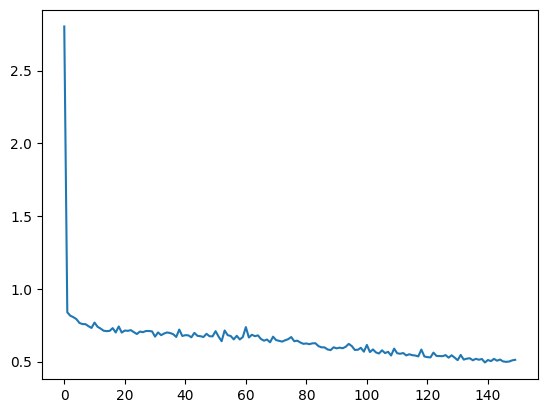

1/1 [==============================] - 0s 119ms/step


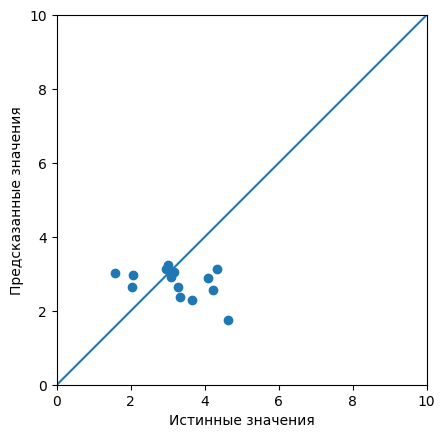

MSE: 1.474501586086653
MAE: 0.9732379831518747

    REAL
    MEAN VALUE: 3.2450261793214272
    MIN VALUE: 1.58043273947649
    MAX VALUE: 4.64223614239184

    PREDICT
    MEAN VALUE: 2.7572054862976074
    MIN VALUE: 1.7434755563735962
    MAX VALUE: 3.2501235008239746
Claser № 4
Model: "Class_4"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 Elu (Dense)                 (None, 16)                224       
                                                                 
 Selu_1 (Dense)              (None, 8)                 136       
                                                                 
 Selu_2 (Dense)              (None, 8)                 72        
                                                                 
 Output (Dense)              (None, 1)                 9         
                                                                 
Total params: 441 (1.72 KB)
Trainable pa

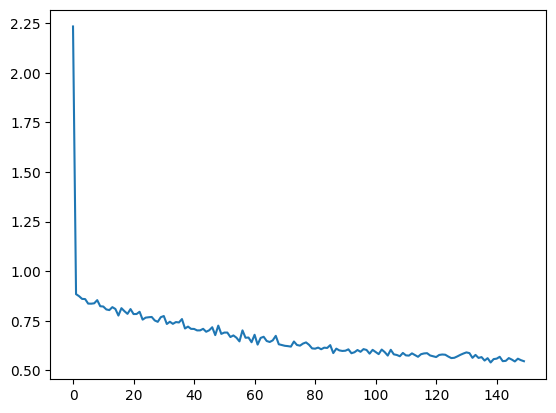

1/1 [==============================] - 0s 94ms/step


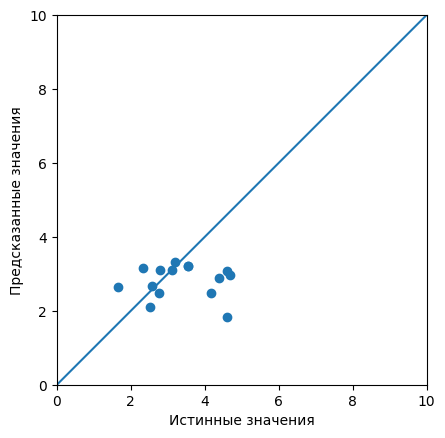

MSE: 1.3572798063226463
MAE: 0.8637601013722993

    REAL
    MEAN VALUE: 3.3638157456964906
    MIN VALUE: 1.64623545364476
    MAX VALUE: 4.67282291705565

    PREDICT
    MEAN VALUE: 2.815514326095581
    MIN VALUE: 1.829487919807434
    MAX VALUE: 3.308642625808716
Claser № 5
Model: "Class_5"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 Elu (Dense)                 (None, 16)                224       
                                                                 
 Selu_1 (Dense)              (None, 8)                 136       
                                                                 
 Selu_2 (Dense)              (None, 8)                 72        
                                                                 
 Output (Dense)              (None, 1)                 9         
                                                                 
Total params: 441 (1.72 KB)
Trainable para

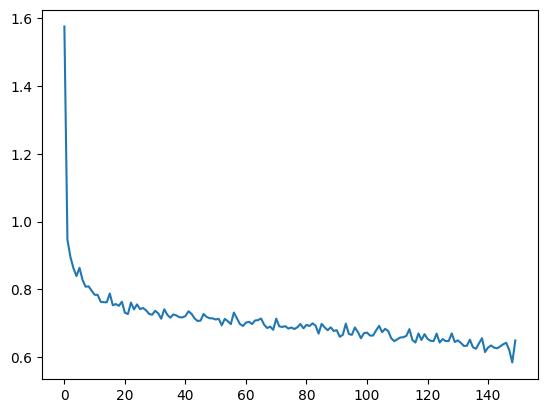

1/1 [==============================] - 0s 94ms/step


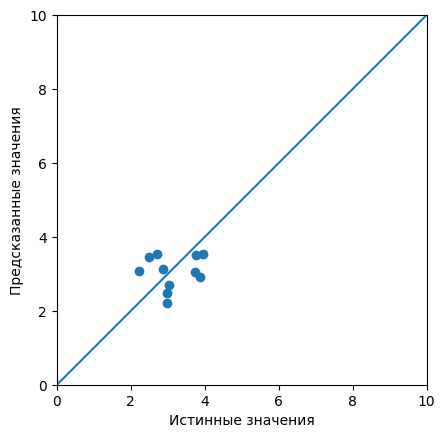

MSE: 0.45287324222281367
MAE: 0.6213970056410778

    REAL
    MEAN VALUE: 3.148018394116829
    MIN VALUE: 2.21313025571143
    MAX VALUE: 3.95283414387118

    PREDICT
    MEAN VALUE: 3.051163673400879
    MIN VALUE: 2.20839262008667
    MAX VALUE: 3.530522346496582
Claser № 6
Model: "Class_6"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 Elu (Dense)                 (None, 16)                224       
                                                                 
 Selu_1 (Dense)              (None, 8)                 136       
                                                                 
 Selu_2 (Dense)              (None, 8)                 72        
                                                                 
 Output (Dense)              (None, 1)                 9         
                                                                 
Total params: 441 (1.72 KB)
Trainable param

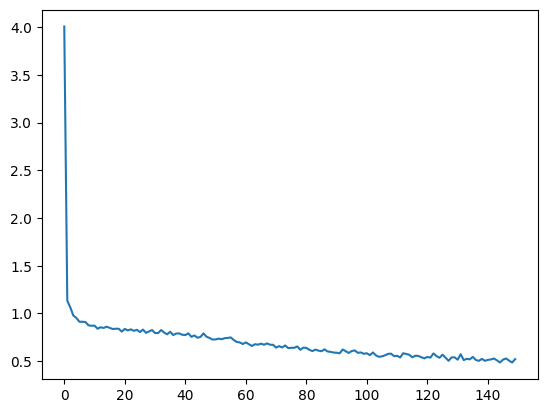

1/1 [==============================] - 0s 110ms/step


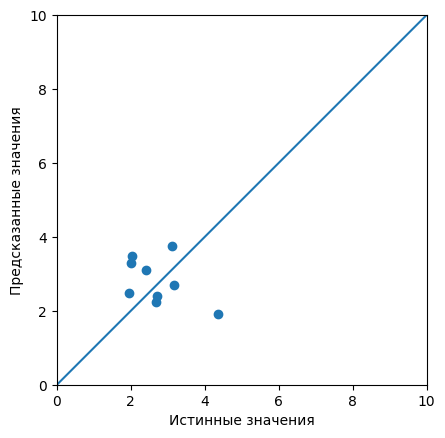

MSE: 1.2621897469113819
MAE: 0.9165320609118083

    REAL
    MEAN VALUE: 2.7130984974033887
    MIN VALUE: 1.94066274797628
    MAX VALUE: 4.37109464519951

    PREDICT
    MEAN VALUE: 2.818866729736328
    MIN VALUE: 1.9264219999313354
    MAX VALUE: 3.763472080230713
Claser № 7
Model: "Class_7"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 Elu (Dense)                 (None, 16)                224       
                                                                 
 Selu_1 (Dense)              (None, 8)                 136       
                                                                 
 Selu_2 (Dense)              (None, 8)                 72        
                                                                 
 Output (Dense)              (None, 1)                 9         
                                                                 
Total params: 441 (1.72 KB)
Trainable par

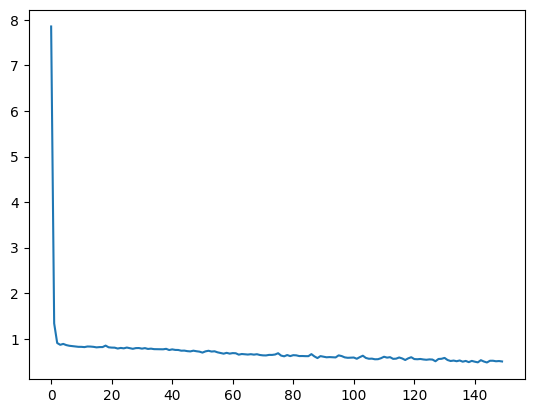

1/1 [==============================] - 0s 141ms/step


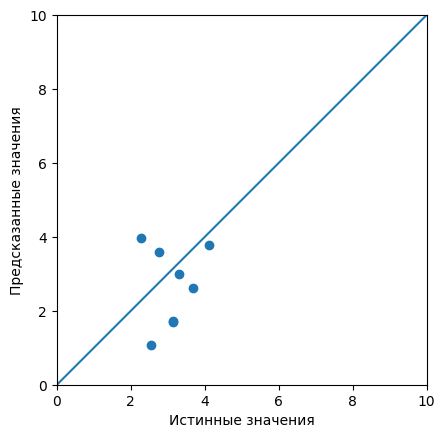

MSE: 1.4187558395440685
MAE: 1.080128836572404

    REAL
    MEAN VALUE: 3.1254735143935113
    MIN VALUE: 2.27518169360637
    MAX VALUE: 4.11749665053546

    PREDICT
    MEAN VALUE: 2.679431915283203
    MIN VALUE: 1.0721442699432373
    MAX VALUE: 3.969923257827759
Claser № 8
Model: "Class_8"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 Elu (Dense)                 (None, 16)                224       
                                                                 
 Selu_1 (Dense)              (None, 8)                 136       
                                                                 
 Selu_2 (Dense)              (None, 8)                 72        
                                                                 
 Output (Dense)              (None, 1)                 9         
                                                                 
Total params: 441 (1.72 KB)
Trainable para

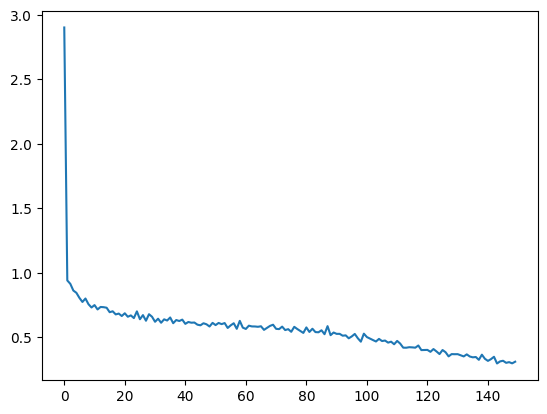

1/1 [==============================] - 0s 75ms/step


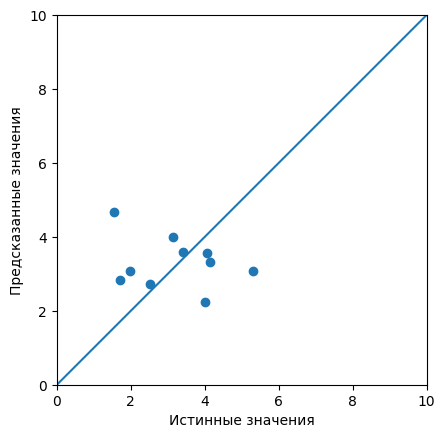

MSE: 2.197816314711701
MAE: 1.1856097208214451

    REAL
    MEAN VALUE: 3.181059071787151
    MIN VALUE: 1.54570769490491
    MAX VALUE: 5.3141436851035

    PREDICT
    MEAN VALUE: 3.310274600982666
    MIN VALUE: 2.2463936805725098
    MAX VALUE: 4.669246673583984
Claser № 9
Model: "Class_9"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 Elu (Dense)                 (None, 16)                224       
                                                                 
 Selu_1 (Dense)              (None, 8)                 136       
                                                                 
 Selu_2 (Dense)              (None, 8)                 72        
                                                                 
 Output (Dense)              (None, 1)                 9         
                                                                 
Total params: 441 (1.72 KB)
Trainable params

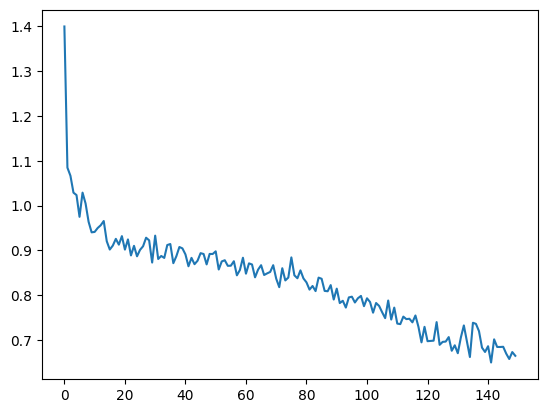

1/1 [==============================] - 0s 125ms/step


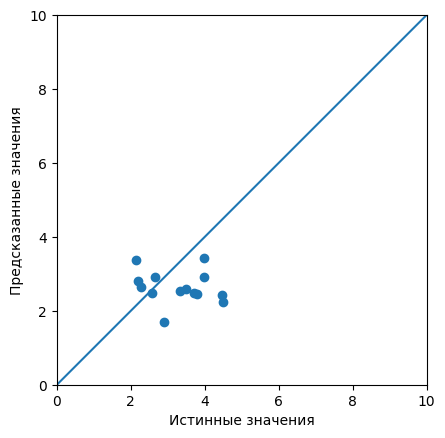

MSE: 1.348130332618307
MAE: 0.9938701539967868

    REAL
    MEAN VALUE: 3.2832606978296726
    MIN VALUE: 2.15067956523653
    MAX VALUE: 4.48413457633867

    PREDICT
    MEAN VALUE: 2.6390268802642822
    MIN VALUE: 1.7025197744369507
    MAX VALUE: 3.4167187213897705


In [290]:
ii_NN = 1
NN_models = []
NN_normalizators = []
for claster in ds_by_clusters_NN_without_test_samples:
    print(f'Claser № {ii_NN}')
    
    columns = claster.columns

    y = Y
    indexes = claster.index
    y = y.loc[indexes]
    
    x_train, x_test, y_train, y_test = train_test_split(claster, y, train_size=0.9)
    
    # Нормализуем данные
    scaler = MinMaxScaler()
    X_train = scaler.fit_transform(x_train)
    X_test = scaler.transform(x_test)
    NN_normalizators.append(scaler)  

    # Create model
    model = Sequential(name=f'Class_{ii_NN}')
    model.add(tf.keras.layers.Input(len(columns), name='Input'))
    # model.add(tf.keras.layers.Dropout(0.5))
    model.add(Dense(16, activation='elu', name='Elu'))
    model.add(Dense(8, activation='selu', name='Selu_1'))
    # Попадает больше в тестовые данные
    # model.add(Dense(8, activation='elu', name='Elu_2')) # the best variant 1
    # Лучше предсказывает отложенные для демонстрации данные
    model.add(Dense(8, activation='selu', name='Selu_2')) # the best variant 2
    model.add(Dense(1, name='Output'))
    
    # BEST optimizers
    # Adam, Lion, Nadam, RMSprop

    # * mean_absolute_percentage_error 
    # * huber_loss
    # * log_cosh
    # * mean_absolute_percentage_error
    # * cosine_similarity
    # * mean_absolute_error
    # * mean_squared_error
    # * mean_squared_logarithmic_error
    
    # Compile
    
    model.compile(loss='mse',         
                  optimizer=tf.keras.optimizers.Adam(learning_rate=0.001),
                  # metrics=['mae'])
                  metrics=['mse'])
    
    print(model.summary()) # Выводим структуру сети
    # Train NN
    history=model.fit(X_train,
                      y_train,
                      batch_size=1,
                      epochs=150,
                      # validation_data=(X_test, y_test),
                      # Calculate validation results on 20% of the training data.
                      # validation_split = 0.2)
                      # Подавляем вывол протоколов обучения.
                      verbose=0
                     )
    
    plt.plot(history.history['mse'])
    plt.show()
    
    test_predictions = model.predict(X_test).flatten()
    
    a = plt.axes(aspect='equal')
    plt.scatter(y_test, test_predictions)
    plt.xlabel('Истинные значения')
    plt.ylabel('Предсказанные значения')
    lims = [0, 10]
    plt.xlim(lims)
    plt.ylim(lims)
    _ = plt.plot(lims, lims)
    plt.show()
    
    print(f'MSE: {mean_squared_error(y_test, test_predictions)}')
    print(f'MAE: {mean_absolute_error(y_test, test_predictions)}')
    
    print(f'''
    REAL
    MEAN VALUE: {np.mean(y_test)}
    MIN VALUE: {np.min(y_test)}
    MAX VALUE: {np.max(y_test)}''')
    
    print(f'''
    PREDICT
    MEAN VALUE: {np.mean(test_predictions)}
    MIN VALUE: {np.min(test_predictions)}
    MAX VALUE: {np.max(test_predictions)}''')

    NN_models.append(model)
    ii_NN+=1

# Обучение НС на всем объеме данных (датасет с применением OneHotEncoder для классов)

Claser № 11
Model: "Without_classes_model"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 Selu (Dense)                (None, 64)                1408      
                                                                 
 Relu6 (Dense)               (None, 128)               8320      
                                                                 
 Output (Dense)              (None, 1)                 129       
                                                                 
Total params: 9857 (38.50 KB)
Trainable params: 9857 (38.50 KB)
Non-trainable params: 0 (0.00 Byte)
_________________________________________________________________
None


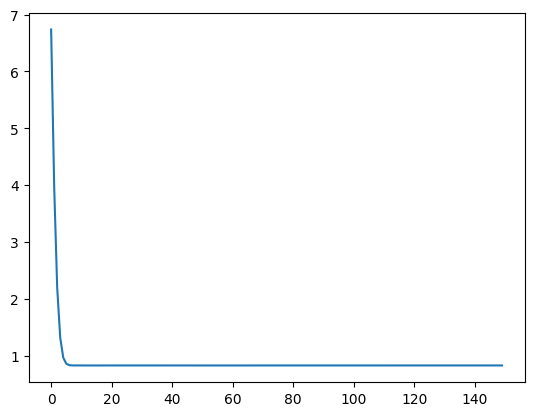

4/4 [==============================] - 0s 4ms/step


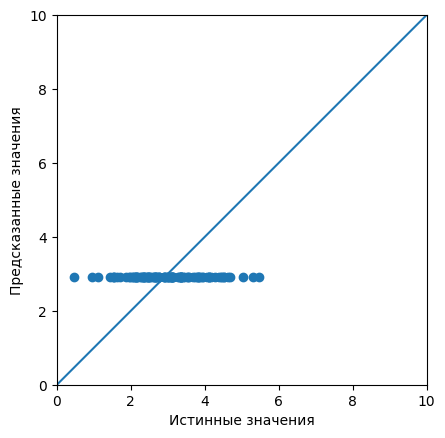

MSE: 0.9181766605715228
MAE: 0.762379275068659

REAL
MEAN VALUE: 2.9913782619889404
MIN VALUE: 0.463342035924085
MAX VALUE: 5.45556617827335

PREDICT
MEAN VALUE: 2.9235363006591797
MIN VALUE: 2.923537015914917
MAX VALUE: 2.923537015914917


In [239]:


print('Model without clasters')
ii_NN+=1

x = df_for_NN

columns = x.columns

# x = cluster
# y = df_copy['Модуль упругости при растяжении, ГПа', 'Прочность при растяжении, МПа']
# y = Y_1 + Y_2
y = Y

x_train, x_test, y_train, y_test = train_test_split(x, y, train_size=0.9)

# Нормализуем данные
scaler = MinMaxScaler()
X_train = scaler.fit_transform(x_train)
X_test = scaler.transform(x_test)

# # Add normalizer layer
# normalizer = tf.keras.layers.Normalization(axis=-1, input_shape=[len(columns),])
# # Предобучение
# normalizer.adapt(np.array(x_train))
# print(normalizer.mean.numpy())

# y_column = y.columns

# # создаем временные структуры
# TestModels = pd.DataFrame(columns=['Model', 'R2_Y_1', 'R2_Y_2'])
# tmp = {}


# model = Sequential([normalizer])
model = Sequential(name='Without_classes_model')
model.add(tf.keras.layers.Input(len(columns), name='Input'))
# model.add(tf.keras.layers.Dropout(0.5))
model.add(Dense(64, activation='selu', name='Selu'))
model.add(Dense(128, activation='relu6', name='Relu6'))
# model.add(Dense(32, activation='elu')) # the best variant
# model.add(Dense(180, activation='elu')) # the best variant
# model.add(Dense(160, activation='relu6')) # the best variant
# model.add(Dense(64, activation='relu6')) # the best variant
# model.add(Dense(32, activation='mish')) # the best variant
# model.add(tf.keras.layers.ELU())

# model.add(ReLU())
# model.add(Dense(64, activation='mish'))
#IMPORTANT PART
model.add(Dense(1, name='Output'))

# PREDICT
# MEAN VALUE: 2.9149367809295654
# MIN VALUE: 0.1824452131986618
# MAX VALUE: 5.307587146759033

# BEST optimizers
# Adam, Lion, Nadam, RMSprop

# Ftrl gives one number in output



# * mean_absolute_percentage_error 
# * huber_loss
# * log_cosh
# * mean_absolute_percentage_error
# * cosine_similarity
# * mean_absolute_error
# * mean_squared_error
# * mean_squared_logarithmic_error

# Compile

model.compile(loss='mse',              
              # optimizer=Adam(learning_rate=0.2), 
              # optimizer='adam',
              optimizer=tf.keras.optimizers.Nadam(learning_rate=0.001),
              # metrics=['mae'])
              metrics=['mse'])

print(model.summary()) # Выводим структуру сети
# Train NN
history=model.fit(X_train,
# history=model.fit(x_train,
                  y_train,
                  batch_size=1,
                  epochs=150,
                  # validation_data=(X_test, y_test),
                  # Calculate validation results on 20% of the training data.
                  # validation_split = 0.2)
                  # Подавляем вывол протоколов обучения.
                  verbose=0,
                  # Используем 20% обучающих данных для валидации.
                  # validation_split = 0.2)
                 )

plt.plot(history.history['mse'])
# plt.plot(history.history['hindle'])
plt.show()

test_predictions = model.predict(X_test).flatten()

a = plt.axes(aspect='equal')
plt.scatter(y_test, test_predictions)
plt.xlabel('Истинные значения')
plt.ylabel('Предсказанные значения')
lims = [0, 10]
plt.xlim(lims)
plt.ylim(lims)
_ = plt.plot(lims, lims)
plt.show()

print(f'MSE: {mean_squared_error(y_test, test_predictions)}')
print(f'MAE: {mean_absolute_error(y_test, test_predictions)}')

print(f'''
REAL
MEAN VALUE: {np.mean(y_test)}
MIN VALUE: {np.min(y_test)}
MAX VALUE: {np.max(y_test)}''')

print(f'''
PREDICT
MEAN VALUE: {np.mean(test_predictions)}
MIN VALUE: {np.min(test_predictions)}
MAX VALUE: {np.max(test_predictions)}''')


# Поиск закономерностей в весах модели

In [221]:
for model in NN_models:
    print(model.get_weights()[0:])

[array([[-0.3672743 ,  0.2804086 ,  0.22398119, ...,  0.09228087,
        -0.24249868, -0.13330503],
       [ 0.22114922,  0.13146022, -0.02209487, ...,  0.16965194,
        -0.17806321,  0.21137862],
       [-0.07283997,  0.09593424, -0.22350915, ..., -0.11697333,
         0.2789534 ,  0.3185961 ],
       ...,
       [-0.14908853, -0.25070617,  0.02489418, ...,  0.09659255,
        -0.19954407, -0.11387827],
       [-0.0899518 ,  0.05856481,  0.00471431, ..., -0.1107839 ,
         0.10860974, -0.13817802],
       [-0.04581787, -0.2020617 ,  0.05421203, ..., -0.11873791,
        -0.23251945, -0.07369472]], dtype=float32), array([ 0.06102583, -0.05897471,  0.02391356, -0.03251323, -0.09114491,
       -0.00567322,  0.00624788,  0.0464557 , -0.07054617, -0.06122785,
        0.05804521,  0.03302213,  0.00653243, -0.03852019, -0.03272508,
       -0.04468703,  0.00894128,  0.03201786,  0.01662948, -0.00470178,
       -0.05172869,  0.01520819, -0.03260401, -0.00853082,  0.04163924,
        0.

In [235]:
NN_models[0].get_weights()[0][0]

array([-0.3672743 ,  0.2804086 ,  0.22398119,  0.06766821, -0.32789794,
        0.28281394, -0.02233481,  0.11279774,  0.11824641, -0.33355057,
        0.19774053, -0.20727159,  0.13816439, -0.16695698,  0.08545034,
       -0.16190456,  0.33213934,  0.05239651,  0.15785395, -0.15605536,
        0.29446486,  0.3162763 , -0.34442785, -0.16596594,  0.08643349,
       -0.05271748, -0.15054391, -0.22237484,  0.04043962,  0.05073156,
       -0.2102523 ,  0.21117288,  0.02360979,  0.20379804, -0.20399468,
       -0.22271612, -0.21700498,  0.15008107, -0.12131175, -0.1264494 ,
       -0.28642336, -0.18319637, -0.13566115, -0.04587113,  0.24398844,
        0.04192535,  0.32486185, -0.12312214,  0.04807385,  0.1961634 ,
       -0.1088228 , -0.04163305, -0.1502933 , -0.14965688,  0.09585743,
        0.29594323,  0.20435774,  0.13480528, -0.17270991,  0.14473893,
        0.19384138,  0.09228087, -0.24249868, -0.13330503], dtype=float32)

In [241]:
for layer in NN_models[0].layers:
    print(layer.name, layer)

Selu <keras.src.layers.core.dense.Dense object at 0x000001D038C81B70>
Relu6 <keras.src.layers.core.dense.Dense object at 0x000001D038C81A80>
dense_669 <keras.src.layers.core.dense.Dense object at 0x000001D038CA0220>


In [242]:
print(NN_models[0].layers[0].weights)

[<tf.Variable 'Selu/kernel:0' shape=(21, 64) dtype=float32, numpy=
array([[ 0.3775199 ,  0.02461413, -0.310185  , ..., -0.07736787,
         0.15282539, -0.00902135],
       [-0.30788124,  0.10323227, -0.10582905, ...,  0.2709925 ,
         0.13825572, -0.09683637],
       [ 0.05902821,  0.0562767 , -0.15870251, ...,  0.07145906,
        -0.250851  ,  0.04953248],
       ...,
       [-0.10774244,  0.1727731 ,  0.12227002, ...,  0.13485411,
         0.20366564,  0.09222713],
       [-0.12460971, -0.18796009,  0.06154889, ..., -0.10633342,
         0.16566575, -0.24622501],
       [ 0.10568419,  0.2208263 ,  0.18809724, ..., -0.21846731,
        -0.02660719,  0.13661045]], dtype=float32)>, <tf.Variable 'Selu/bias:0' shape=(64,) dtype=float32, numpy=
array([ 0.05553226,  0.05353316,  0.06407981, -0.02955816,  0.04371394,
       -0.05886814, -0.02417704, -0.03793249,  0.01182299, -0.04174704,
       -0.00538431, -0.09510094,  0.03039574, -0.02282962, -0.01109389,
       -0.02408287,  0.040

# Проверка НС

In [289]:
iter_test = 0
for model in NN_models:
    print(f'Claster № {iter_test+1}')
    normalizator = NN_normalizators[iter_test]
    sample = normalizator.transform(sample_for_test[iter_test])
    print(model.predict(sample))
    print(Y.loc[sample_for_test[iter_test].index])
    iter_test += 1

Claster № 1
1/1 [==============================] - 0s 30ms/step
[[1.2601254]]
457    3.188971
Name: Соотношение матрица-наполнитель, dtype: float64
Claster № 2
1/1 [==============================] - 0s 31ms/step
[[3.0528097]]
896    3.864035
Name: Соотношение матрица-наполнитель, dtype: float64
Claster № 3
1/1 [==============================] - 0s 30ms/step
[[3.2116802]]
796    3.299063
Name: Соотношение матрица-наполнитель, dtype: float64
Claster № 4
1/1 [==============================] - 0s 33ms/step
[[3.5999131]]
145    2.700639
Name: Соотношение матрица-наполнитель, dtype: float64
Claster № 5
1/1 [==============================] - 0s 41ms/step
[[2.721837]]
886    1.885174
Name: Соотношение матрица-наполнитель, dtype: float64
Claster № 6
1/1 [==============================] - 0s 28ms/step
[[2.365846]]
244    2.862056
Name: Соотношение матрица-наполнитель, dtype: float64
Claster № 7
1/1 [==============================] - 0s 34ms/step
[[3.1089945]]
697    1.827105
Name: Соотношение ма

In [291]:
it = 0
for model in NN_models:
    it += 1
    model.save(f'NN_model_{it}')

INFO:tensorflow:Assets written to: NN_model_1\assets


INFO:tensorflow:Assets written to: NN_model_1\assets


INFO:tensorflow:Assets written to: NN_model_2\assets


INFO:tensorflow:Assets written to: NN_model_2\assets


INFO:tensorflow:Assets written to: NN_model_3\assets


INFO:tensorflow:Assets written to: NN_model_3\assets


INFO:tensorflow:Assets written to: NN_model_4\assets


INFO:tensorflow:Assets written to: NN_model_4\assets


INFO:tensorflow:Assets written to: NN_model_5\assets


INFO:tensorflow:Assets written to: NN_model_5\assets


INFO:tensorflow:Assets written to: NN_model_6\assets


INFO:tensorflow:Assets written to: NN_model_6\assets


INFO:tensorflow:Assets written to: NN_model_7\assets


INFO:tensorflow:Assets written to: NN_model_7\assets


INFO:tensorflow:Assets written to: NN_model_8\assets


INFO:tensorflow:Assets written to: NN_model_8\assets


INFO:tensorflow:Assets written to: NN_model_9\assets


INFO:tensorflow:Assets written to: NN_model_9\assets


In [292]:
import joblib
it_n = 0
for scaler in NN_normalizators:
    it_n += 1
    joblib.dump(scaler, f'NN_normalization_model_{it_n}.save')

AttributeError: 'MinMaxScaler' object has no attribute 'save'